In [ ]:
# imports
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import re

In [ ]:
# create df and read file
df = pd.read_csv('/content/weather.csv')

In [ ]:
weather_df = df.copy()

In [ ]:
weather_df.head(20)

,Unnamed: 0,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow
0,1,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0.0,No
1,2,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0.0,No
2,3,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,0.0,No
3,4,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,1.0,No
4,5,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0.2,No
5,6,2008-12-06,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,...,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,No,0.0,No
6,7,2008-12-07,Albury,14.3,25.0,0.0,NaN,NaN,W,50.0,...,19.0,1009.6,1008.2,1.0,NaN,18.1,24.6,No,0.0,No
7,8,2008-12-08,Albury,7.7,26.7,0.0,NaN,NaN,W,35.0,...,19.0,1013.4,1010.1,NaN,NaN,16.3,25.5,No,0.0,No
8,9,2008-12-09,Albury,9.7,31.9,0.0,NaN,NaN,NNW,80.0,...,9.0,1008.9,1003.6,NaN,NaN,18.3,30.2,No,1.4,Yes
9,10,2008-12-10,Albury,13.1,30.1,1.4,NaN,NaN,W,28.0,...,27.0,1007.0,1005.7,NaN,NaN,20.1,28.2,Yes,0.0,No


In [ ]:
# look at data types, nulls, rows, columns

weather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 226868 entries, 0 to 226867
Data columns (total 25 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Unnamed: 0     226868 non-null  int64  
 1   Date           226868 non-null  object 
 2   Location       226868 non-null  object 
 3   MinTemp        223068 non-null  float64
 4   MaxTemp        223238 non-null  float64
 5   Rainfall       220093 non-null  float64
 6   Evaporation    103612 non-null  float64
 7   Sunshine       94231 non-null   float64
 8   WindGustDir    209959 non-null  object 
 9   WindGustSpeed  210068 non-null  float64
 10  WindDir9am     209309 non-null  object 
 11  WindDir3pm     217154 non-null  object 
 12  WindSpeed9am   222435 non-null  float64
 13  WindSpeed3pm   218678 non-null  float64
 14  Humidity9am    221584 non-null  float64
 15  Humidity3pm    217333 non-null  float64
 16  Pressure9am    201792 non-null  float64
 17  Pressure3pm    201813 non-nul

In [ ]:
# get rid of unnamed since its a index not needed
weather_df.drop('Unnamed: 0', axis=1, inplace=True)

In [ ]:
# make date a date so we can use it for date inights
weather_df['Date'] = pd.to_datetime(weather_df['Date'])

###Data Classification

In the dataset  windspeed, humidity  is whole numbers in the excel file, howeverin  python it’s a float.  For convenance data was probably rounded up leaving whole numbers but theoretically, both wind speed and humidity  is continuous.

**Continuous Variables:**
MinTemp represents the minimum temperature recorded and is a continuous variable.
MaxTemp represents the maximum temperature recorded and is a continuous variable.
Rainfall measures the amount of rainfall and is a continuous variable.
Evaporation represents the amount of evaporation and is a continuous variable.
Sunshine measures the amount of sunshine and is a continuous variable.
WindGustSpeed measures the speed of wind gusts and is a continuous variable.
WindSpeed9am measures the wind speed at 9 AM and is a continuous variable.
WindSpeed3pm measures the wind speed at 3 PM and is a continuous variable.
Humidity9am represents the humidity level at 9 AM and is a continuous variable.
Humidity3pm represents the humidity level at 3 PM and is a continuous variable.
Pressure9am measures the atmospheric pressure at 9 AM and is a continuous variable.
Pressure3pm measures the atmospheric pressure at 3 PM and is a continuous variable.
Cloud9am represents the cloud cover at 9 AM and is a continuous variable.
Cloud3pm represents the cloud cover at 3 PM and is a continuous variable.
Temp9am measures the temperature at 9 AM and is a continuous variable.
Temp3pm measures the temperature at 3 PM and is a continuous variable.
RISK_MM represents the amount of rain risk in millimeters and is a continuous variable.

**Date**

Date represents the date of the observation and is a nominal variable but changed to date data type to datee  which can be descrete or continuous depding on the use case

**Nominal Variables:**
Date represents the date of the observation and is a nominal variable.
Location indicates the location of the weather station and is a nominal variable.
RainToday indicates whether it rained today and is a nominal variable.
RainTomorrow indicates whether it will rain tomorrow and is a nominal variable.
WindGustDir sine its W, N and so on .
WindDir9am can be consisered nominal since its not representation of degrees and a letter direction of W,N and so on
WindDir3pm indicates the wind direction at 3 PM and can be considered an nominal


##Summary Data Analysis/Summary Statistics:  
####Feature Engineering, EDA, Univariate Analysis, bivariate Analysis, Multivariate Analysis

**Feature Engineering**

In [ ]:
# get rid of nulls for raintomrrrow because its a small amount of nulls and its are target veriable.
weather_df.dropna(subset=['RainTomorrow'], inplace=True)

In [ ]:
# to handle nulls we have to use advance methods since some columns have high nulls such as sunshin, evaporation
# suggest trying mode for categorical columns and random imputer for numerical columns
# want to handle nulls before visuals so charts are not missing data
# imports needed

from sklearn.impute import SimpleImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

In [ ]:
# Make a copy of the original DataFrame to preserve the original missing values
original_weather_df = weather_df.copy()

In [ ]:
# Separate numerical and categorical columns
numerical_cols = original_weather_df.select_dtypes(include=[np.number]).columns
categorical_cols = original_weather_df.select_dtypes(include=[object]).columns

In [ ]:
# Save original number of missing values
original_missing_values = original_weather_df.isnull().sum()

In [ ]:
# Impute numerical columns using IterativeImputer (random imputation)
iterative_imputer = IterativeImputer(random_state=0)
weather_df[numerical_cols] = iterative_imputer.fit_transform(original_weather_df[numerical_cols])

/usr/local/lib/python3.10/dist-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


In [ ]:
# Save new number of missing values
new_missing_values = weather_df.isnull().sum()

In [ ]:
# Calculate percentage change in missing values based on total entries
total_entries = len(weather_df)
percentage_change = ((original_missing_values - new_missing_values) / total_entries * 100).round(2)

# Print the percentage change in missing values for all columns
print("Percentage change in missing values for all columns:")
print(percentage_change)

Percentage change in missing values for all columns:
Date              0.00
Location          0.00
MinTemp           0.53
MaxTemp           0.34
Rainfall          0.96
Evaporation      53.61
Sunshine         57.80
WindGustDir       0.00
WindGustSpeed     6.79
WindDir9am        0.00
WindDir3pm        0.00
WindSpeed9am      1.69
WindSpeed3pm      3.37
Humidity9am       1.18
Humidity3pm       3.09
Pressure9am      10.74
Pressure3pm      10.73
Cloud9am         42.69
Cloud3pm         45.23
Temp9am           0.55
Temp3pm           2.49
RainToday         0.00
RISK_MM           0.00
RainTomorrow      0.00
dtype: float64


**Evaluation of Distribution Changes Due to Imputation**

I initially used the mediam for all numerical features, resulting in around 50% change across these features. This indicates that the mode imputation significantly altered the distribution of numerical data, suggesting the need for a different approach.

For categorical features, the mode imputation method was applied, and the changes remained under 10%, indicating that this method did not significantly impact the categorical data distribution.

I also attempted to use KNN imputation; however, it took a long time to execute and resulted in an error. Subsequently, I tried using the median imputation for features most affected by nulls and the IterativeImputer for those with fewer nulls. This approach resulted in a lower overall change.

Despite these efforts, certain columns such as Sunshine, Evaporation, Cloud9am, and Cloud3pm showed very high percentage changes, indicating substantial missing data. These columns had a high percentage of null values, making them difficult to work with and suggesting that the data for these features was not well captured. For these columns, a review of the imputation method or considering dropping them from the analysis might be necessary.

Finally, I used random imputation, which resulted in similar outcomes with a slightly lower change (around 1% lower). This indicates that while random imputation can be an option, it may not sufficiently address the underlying issues with the data capture for certain features

In [ ]:
# check for nulls
weather_df.isnull().sum()

Date                 0
Location             0
MinTemp              0
MaxTemp              0
Rainfall             0
Evaporation          0
Sunshine             0
WindGustDir      15044
WindGustSpeed        0
WindDir9am       16555
WindDir3pm        8900
WindSpeed9am         0
WindSpeed3pm         0
Humidity9am          0
Humidity3pm          0
Pressure9am          0
Pressure3pm          0
Cloud9am             0
Cloud3pm             0
Temp9am              0
Temp3pm              0
RainToday         2110
RISK_MM              0
RainTomorrow         0
dtype: int64

**Summary Stats**

In [ ]:
# look at summary stat for numerical columns
weather_df.describe()

,Date,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RISK_MM
count,220094,220094.000000,220094.000000,220094.000000,220094.000000,220094.000000,220094.000000,220094.000000,220094.000000,220094.000000,220094.000000,220094.000000,220094.000000,220094.000000,220094.000000,220094.000000,220094.000000,220094.000000
mean,2016-01-26 04:13:08.128708096,12.097017,23.233757,2.352972,5.157231,7.339587,39.820089,14.017662,18.583247,68.986663,51.520787,1017.724791,1015.311131,4.487132,4.559763,16.913556,21.711245,2.348583
min,2007-11-01 00:00:00,-10.596962,-4.100000,-4.601371,-5.396970,-17.463056,2.000000,-2.372056,0.000000,0.000000,-5.438012,978.600000,972.000000,-2.718956,0.000000,-6.200000,-5.100000,0.000000
25%,2012-04-11 00:00:00,7.500000,18.000000,0.000000,2.800000,4.901166,31.000000,7.000000,13.000000,57.000000,36.000000,1013.500000,1011.000000,2.281250,2.817965,12.200000,16.600000,0.000000
50%,2015-08-23 00:00:00,11.900000,22.700000,0.000000,4.800000,7.579371,39.000000,13.000000,17.666065,70.000000,52.000000,1017.833164,1015.400000,4.719242,4.674771,16.700000,21.100000,0.000000
75%,2019-11-26 00:00:00,16.700000,28.200000,0.800000,6.930331,10.000000,48.000000,19.000000,24.000000,84.000000,66.000000,1021.962313,1019.600000,7.000000,6.989113,21.500000,26.400000,0.600000
max,2023-03-25 00:00:00,33.900000,48.900000,474.000000,138.700000,18.456797,146.000000,87.000000,87.000000,137.663610,191.214327,1041.100000,1040.100000,14.618627,16.893335,40.200000,48.200000,474.000000
std,NaN,6.410794,7.109440,8.485437,3.574703,3.400905,13.364915,8.818126,8.626754,19.442703,20.972248,6.732229,6.682410,2.520878,2.340719,6.516757,6.978559,8.542516


####Insights


- **Temperature Extremes**: MinTemp reaches as low as -10.60°C and MaxTemp as high as 48.90°C.
- **Rainfall**: Peaks at 474 mm, though the median is 0 mm, indicating many dry days.
- **Evaporation and Sunshine**: Evaporation up to 138.7 mm, and Sunshine up to 18.46 hours.
- **Wind Gusts**: WindGustSpeed up to 146 km/h.
- **Humidity Variability**: Humidity9am and Humidity3pm have extreme highs, reaching over 137% and 191%,
- **Pressure Range**: Pressure varies significantly from 978.6 to 1041.1 hPa.
- **Cloud Cover**: Cloud cover shows unusual negative values and a wide range.

In [ ]:
#summary stats for categorical columns
weather_df.describe(include=[object])

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
count,220094,205050,203539,211194,217984,220094
unique,49,16,16,16,2,2
top,Canberra,W,N,SE,No,No
freq,5117,15006,17024,15894,169659,171165


####Highlights

- **Location**: 49 unique locations, most frequent is Canberra (5,117 instances).
- **Wind Directions**:
  - WindGustDir has 16 unique values, most often 'W' (30,050 instances).
  - WindDir9am also has 16 unique values, most often 'N' (33,579 instances).
  - WindDir3pm again has 16 unique values, most often 'SE' (24,794 instances).
- **Rain**:
  - RainToday: Mostly 'No' (171,769 instances).
  - RainTomorrow: Mostly 'No' (171,165 instances).

###Univariate Analysis

In [ ]:
# see the disctinct values for location
weather_df['Location'].unique()

array(['Albury', 'BadgerysCreek', 'Cobar', 'CoffsHarbour', 'Moree',
       'Newcastle', 'NorahHead', 'NorfolkIsland', 'Penrith', 'Richmond',
       'Sydney', 'SydneyAirport', 'WaggaWagga', 'Williamtown',
       'Wollongong', 'Canberra', 'Tuggeranong', 'MountGinini', 'Ballarat',
       'Bendigo', 'Sale', 'MelbourneAirport', 'Melbourne', 'Mildura',
       'Nhil', 'Portland', 'Watsonia', 'Dartmoor', 'Brisbane', 'Cairns',
       'GoldCoast', 'Townsville', 'Adelaide', 'MountGambier', 'Nuriootpa',
       'Woomera', 'Albany', 'Witchcliffe', 'PearceRAAF', 'PerthAirport',
       'Perth', 'SalmonGums', 'Walpole', 'Hobart', 'Launceston',
       'AliceSprings', 'Darwin', 'Katherine', 'Uluru'], dtype=object)

In [ ]:
# see the distinct values for date for years
weather_df['Date'].dt.year.unique()


array([2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018,
       2019, 2020, 2021, 2022, 2023, 2007], dtype=int32)

**year rang from 2007 - 2023**

In [ ]:
# check unique values for windgustdir
weather_df['WindGustDir'].unique()

array(['W', 'WNW', 'WSW', 'NE', 'NNW', 'N', 'NNE', 'SW', 'ENE', 'SSE',
       'S', 'NW', 'SE', 'ESE', nan, 'E', 'SSW'], dtype=object)

array([[<Axes: title={'center': 'Date'}>,
        <Axes: title={'center': 'MinTemp'}>,
        <Axes: title={'center': 'MaxTemp'}>,
        <Axes: title={'center': 'Rainfall'}>],
       [<Axes: title={'center': 'Evaporation'}>,
        <Axes: title={'center': 'Sunshine'}>,
        <Axes: title={'center': 'WindGustSpeed'}>,
        <Axes: title={'center': 'WindSpeed9am'}>],
       [<Axes: title={'center': 'WindSpeed3pm'}>,
        <Axes: title={'center': 'Humidity9am'}>,
        <Axes: title={'center': 'Humidity3pm'}>,
        <Axes: title={'center': 'Pressure9am'}>],
       [<Axes: title={'center': 'Pressure3pm'}>,
        <Axes: title={'center': 'Cloud9am'}>,
        <Axes: title={'center': 'Cloud3pm'}>,
        <Axes: title={'center': 'Temp9am'}>],
       [<Axes: title={'center': 'Temp3pm'}>,
        <Axes: title={'center': 'RISK_MM'}>, <Axes: >, <Axes: >]],
      dtype=object)

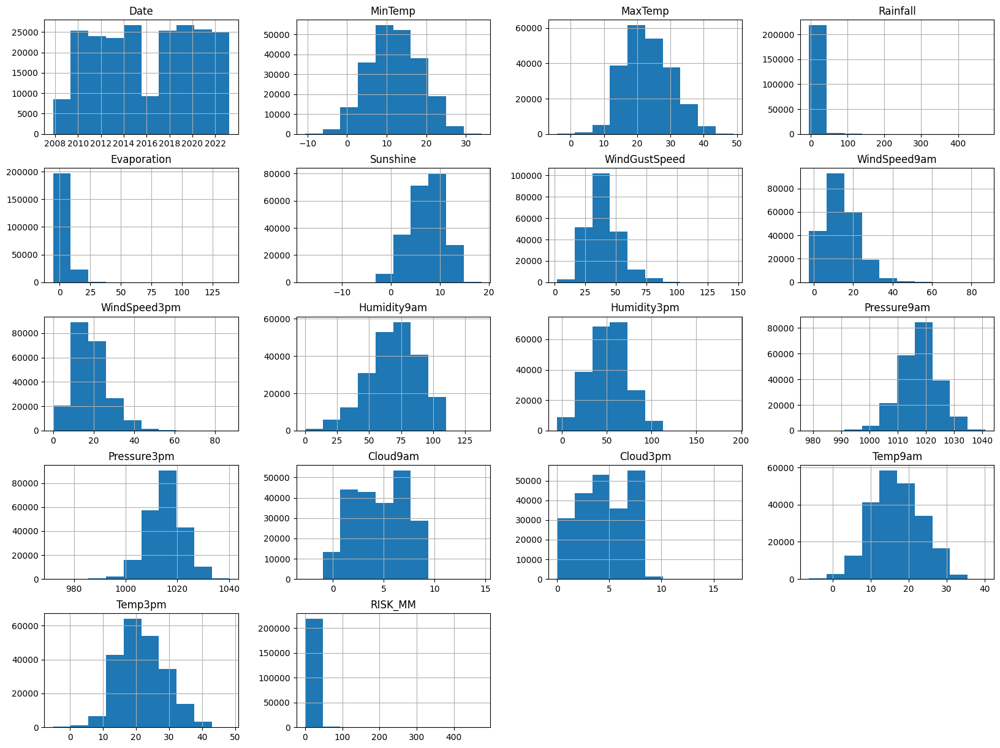

In [ ]:
# looking at historgram of distribution of the data
weather_df.hist(figsize=(20,15))

**Insights**

Date: There are missing data points or significant drops in data collection around 2014-2016.

MinTemp and MaxTemp: Both distributions are roughly normal, centered around 10-20°C for MinTemp and 20-30°C for MaxTemp.

Rainfall: Most rainfall measurements are low, with a few higher outliers.

Evaporation: The data is heavily skewed towards lower values, with a majority being less than 25 mm.

Sunshine: The data is centered around 7-10 hours per day, with a skew towards higher values.

WindGustSpeed: Most wind gust speeds fall between 30 and 60 km/h, with a few higher outliers.

Humidity9am and Humidity3pm: Both distributions are roughly normal, centered around 60-80%.

Pressure9am and Pressure3pm: Both distributions are roughly normal, centered around 1010-1020 hPa.

Cloud9am and Cloud3pm: These have a more uniform distribution with peaks around certain values, indicating common cloud cover conditions.

Temp9am and Temp3pm: Both distributions are roughly normal, centered around 15-25°C.

RISK_MM: Most values are concentrated at the lower end, indicating a low risk of significant rainfall.

In [ ]:
import plotly.express as px
categorical_cols = ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']

for col in categorical_cols:
    fig = px.histogram(weather_df, x=col)
    fig.show()

####Bivariate Analysis

In [ ]:

import plotly.express as px

# Load the dataset



# Calculate the total rainfall for each location
total_rainfall_by_location = weather_df.groupby('Location')['Rainfall'].sum().reset_index()

# Get the top 10 locations by total rainfall
top_10_locations_by_rainfall = total_rainfall_by_location.nlargest(10, 'Rainfall')

# Create an interactive bar chart using Plotly
fig = px.bar(top_10_locations_by_rainfall, x='Location', y='Rainfall',
             title='Top 10 Locations by Total Rainfall',
             labels={'Rainfall': 'Total Rainfall (mm)', 'Location': 'Location'})

# Show the interactive bar chart
fig.show()


In [ ]:
# Calculate the maximum WindGustSpeed for each location
max_wind_gust_speed_by_location = weather_df.groupby('Location')['WindGustSpeed'].max().reset_index()

# Get the top 10 locations by maximum WindGustSpeed
top_10_locations_by_wind_gust_speed = max_wind_gust_speed_by_location.nlargest(10, 'WindGustSpeed')

# Create an interactive bar chart using Plotly
fig = px.bar(top_10_locations_by_wind_gust_speed, x='Location', y='WindGustSpeed',
             title='Top 10 Locations by Maximum WindGustSpeed',
             labels={'WindGustSpeed': 'Maximum Wind Gust Speed (km/h)', 'Location': 'Location'})

# Show the interactive bar chart
fig.show()

In [ ]:
# Calculate the frequency of each location
location_frequency = weather_df['Location'].value_counts().reset_index()
location_frequency.columns = ['Location', 'Frequency']

# Get the top 20 locations by frequency in descending order
top_20_locations_by_frequency = location_frequency.nlargest(20, 'Frequency')

# Create an interactive horizontal bar chart using Plotly
fig = px.bar(top_20_locations_by_frequency, x='Frequency', y='Location', orientation='h',
             title='Top 20 Cities by Frequency',
             labels={'Frequency': 'Frequency', 'Location': 'Location'},
             text='Frequency')

# Update the layout for better visualization
fig.update_layout(yaxis=dict(categoryorder='total ascending'))

# Show the interactive bar chart
fig.show()

In [ ]:

# Aggregate total monthly rainfall
monthly_rainfall = weather_df.groupby(weather_df['Date'].dt.to_period('M'))['Rainfall'].sum().reset_index()

# Convert 'Date' to datetime for plotting
monthly_rainfall['Date'] = monthly_rainfall['Date'].dt.to_timestamp()

# Create an interactive line chart using Plotly
fig = px.line(monthly_rainfall, x='Date', y='Rainfall',
              title='Total Monthly Rainfall',
              labels={'Rainfall': 'Total Rainfall (mm)', 'Date': 'Date'})

# Show the interactive line chart
fig.show()


In [ ]:
# Extract month from the Date column
weather_df['Month'] = weather_df['Date'].dt.month

In [ ]:
# Aggregate total monthly rainfall
monthly_rainfall = weather_df.groupby('Month')['Rainfall'].sum().reset_index()

# Create an interactive bar chart using Plotly
fig = px.bar(monthly_rainfall, x='Month', y='Rainfall',
             title='Total Monthly Rainfall',
             labels={'Rainfall': 'Total Rainfall (mm)', 'Month': 'Month'},
             text='Rainfall')

# Update the layout for better visualization
fig.update_layout(xaxis=dict(tickmode='linear'))

# Show the interactive bar chart
fig.show()

In [ ]:
# Aggregate the count of 'RainTomorrow' for each month
rain_tomorrow_counts = weather_df.groupby(['Month', 'RainTomorrow']).size().reset_index(name='Count')

# Create an interactive grouped bar chart using Plotly
fig = px.bar(rain_tomorrow_counts, x='Month', y='Count', color='RainTomorrow', barmode='group',
             title='Monthly Counts of Rain Tomorrow (Yes/No)',
             labels={'Count': 'Count', 'Month': 'Month', 'RainTomorrow': 'Rain Tomorrow'},
             text='Count')

# Update the layout for better visualization
fig.update_layout(xaxis=dict(tickmode='linear'))

# Show the interactive bar chart
fig.show()

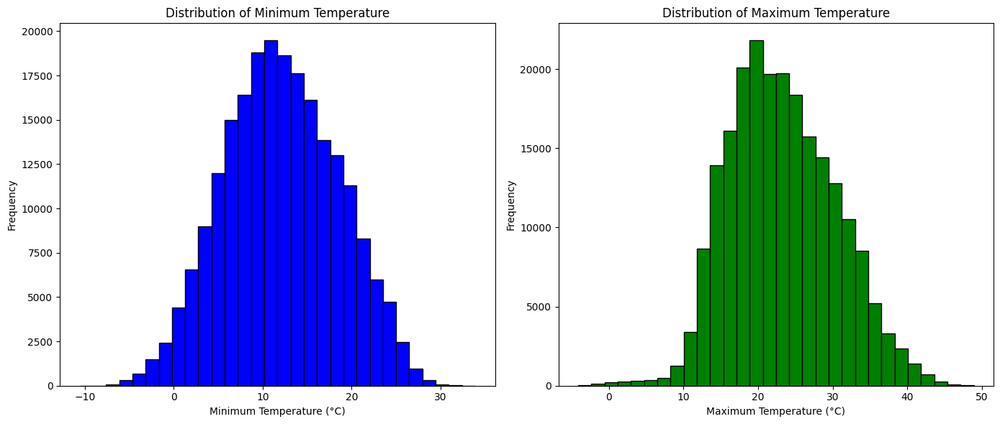

In [ ]:

# Create subplots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

# Plot histogram for MinTemp
axes[0].hist(weather_df['MinTemp'].dropna(), bins=30, color='blue', edgecolor='black')
axes[0].set_title('Distribution of Minimum Temperature')
axes[0].set_xlabel('Minimum Temperature (°C)')
axes[0].set_ylabel('Frequency')

# Plot histogram for MaxTemp
axes[1].hist(weather_df['MaxTemp'].dropna(), bins=30, color='green', edgecolor='black')
axes[1].set_title('Distribution of Maximum Temperature')
axes[1].set_xlabel('Maximum Temperature (°C)')
axes[1].set_ylabel('Frequency')

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()

**Insights**

Minimum Temperature: The distribution is approximately normal, centered around 12°C, with a range from about -10°C to 30°C.

Maximum Temperature: Similarly, the distribution is approximately normal, centered around 23°C, with a range from about -5°C to 45°C.

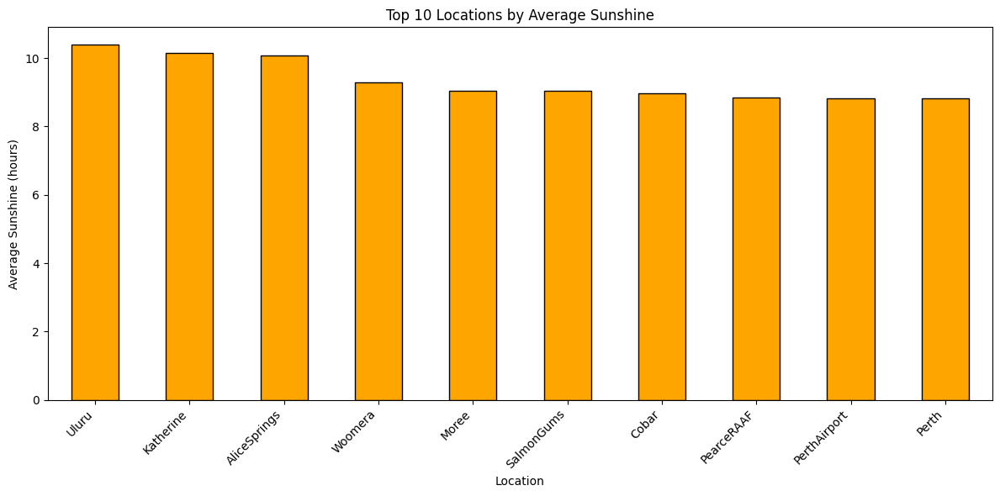

In [ ]:
# Calculate the mean Sunshine for each Location
top_sunshine_locations = weather_df.groupby('Location')['Sunshine'].mean().sort_values(ascending=False).head(10)

# Create a bar chart
plt.figure(figsize=(12, 6))
top_sunshine_locations.plot(kind='bar', color='orange', edgecolor='black')
plt.title('Top 10 Locations by Average Sunshine')
plt.xlabel('Location')
plt.ylabel('Average Sunshine (hours)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

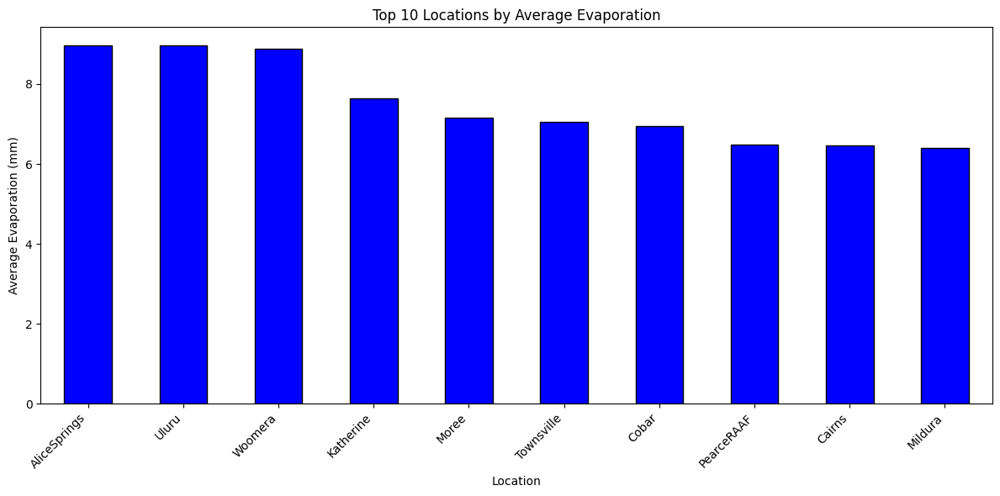

In [ ]:
# Calculate the mean Evaporation for each Location
top_evaporation_locations = weather_df.groupby('Location')['Evaporation'].mean().sort_values(ascending=False).head(10)

# Create a bar chart for Evaporation
plt.figure(figsize=(12, 6))
top_evaporation_locations.plot(kind='bar', color='blue', edgecolor='black')
plt.title('Top 10 Locations by Average Evaporation')
plt.xlabel('Location')
plt.ylabel('Average Evaporation (mm)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

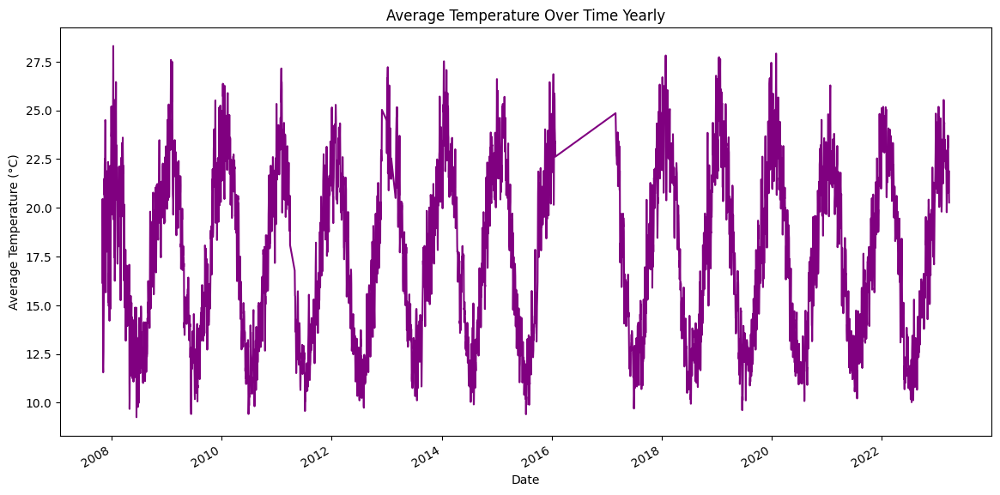

In [ ]:
# Convert 'Date' column to datetime
weather_df['Date'] = pd.to_datetime(weather_df['Date'])

# Calculate daily average temperature
weather_df['AvgTemp'] = (weather_df['MinTemp'] + weather_df['MaxTemp']) / 2

# Plot average temperature over time
plt.figure(figsize=(14, 7))
weather_df.groupby('Date')['AvgTemp'].mean().plot(kind='line', color='purple')
plt.title('Average Temperature Over Time Yearly')
plt.xlabel('Date')
plt.ylabel('Average Temperature (°C)')
plt.show()

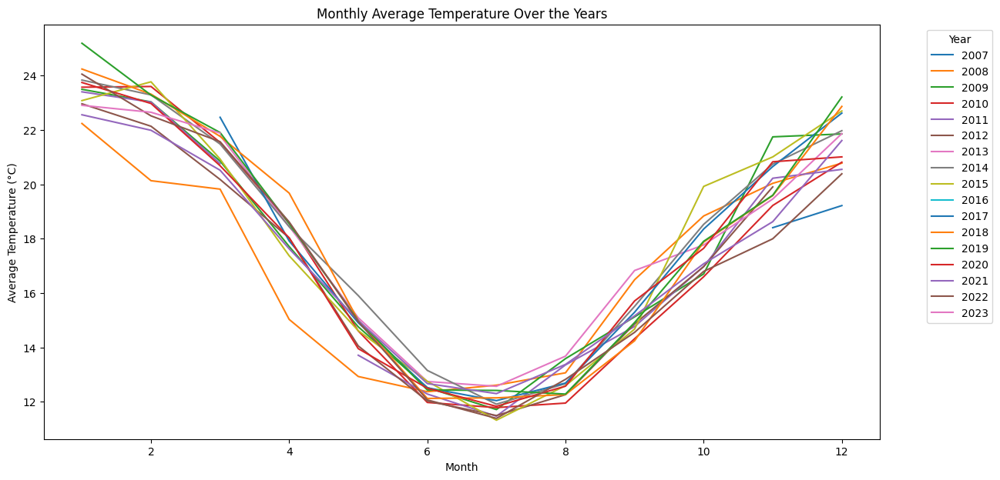

In [ ]:

# Extract month and year from Date
weather_df['Month'] = weather_df['Date'].dt.month
weather_df['Year'] = weather_df['Date'].dt.year

# Calculate daily average temperature
weather_df['AvgTemp'] = (weather_df['MinTemp'] + weather_df['MaxTemp']) / 2

# Calculate monthly average temperature
monthly_avg_temp = weather_df.groupby(['Year', 'Month'])['AvgTemp'].mean().unstack()

# Plot monthly average temperature over the years
plt.figure(figsize=(14, 7))
for year in monthly_avg_temp.index:
    plt.plot(monthly_avg_temp.columns, monthly_avg_temp.loc[year], label=year)

plt.title('Monthly Average Temperature Over the Years')
plt.xlabel('Month')
plt.ylabel('Average Temperature (°C)')
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

**Insights**

Because the data is from the southern hemisphere's we have the following:

Warmest Months: January, February, and December are the warmest months with average temperatures around 21-22°C.

Coolest Months: June and July are the coolest months with average temperatures around 11-12°C.
**bold text**
Seasonal Patterns: There is a clear seasonal temperature pattern, with higher temperatures during the summer months (December to February) and lower temperatures during the winter months (June to August).

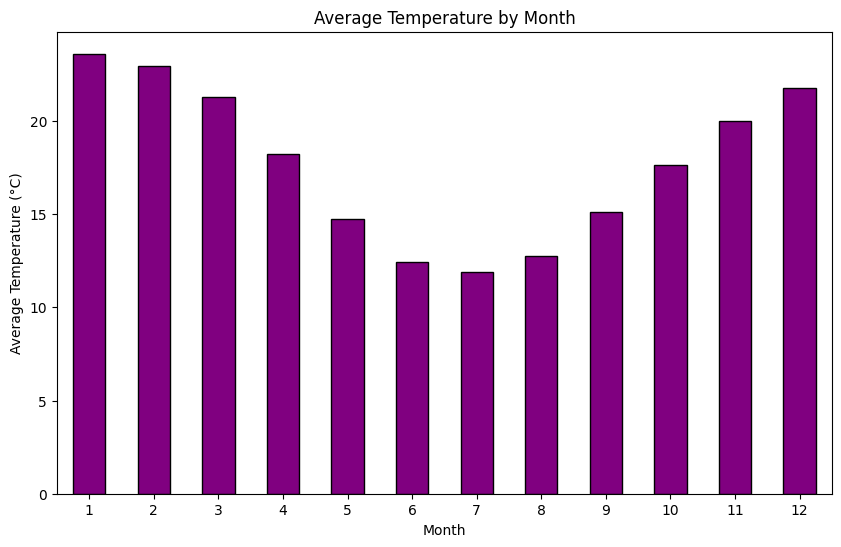

In [ ]:
# Calculate daily average temperature
weather_df['AvgTemp'] = (weather_df['MinTemp'] + weather_df['MaxTemp']) / 2

# Calculate monthly average temperature
monthly_avg_temp = weather_df.groupby('Month')['AvgTemp'].mean()

# Plot monthly average temperature over time
plt.figure(figsize=(10, 6))
monthly_avg_temp.plot(kind='bar', color='purple', edgecolor='black')
plt.title('Average Temperature by Month')
plt.xlabel('Month')
plt.ylabel('Average Temperature (°C)')
plt.xticks(rotation=0)
plt.show()

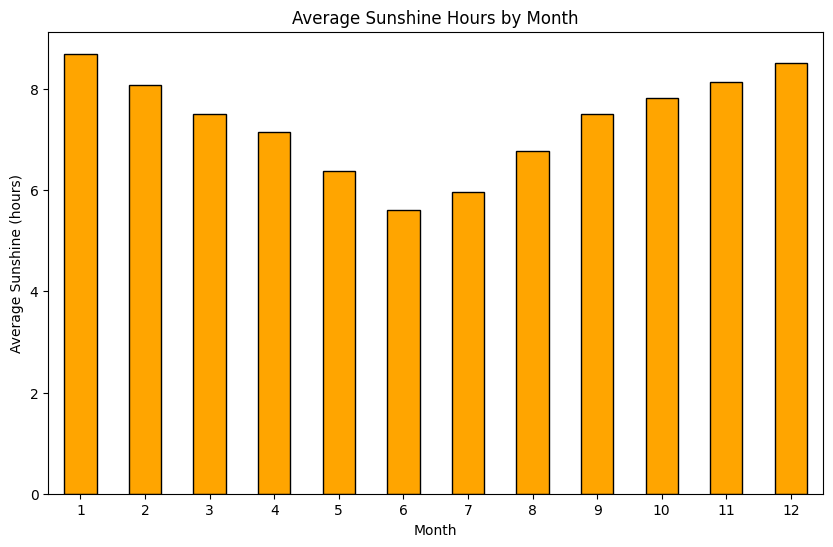

In [ ]:
# Calculate average sunshine hours by month
avg_sunshine_by_month = weather_df.groupby('Month')['Sunshine'].mean()

# Plot average sunshine hours by month
plt.figure(figsize=(10, 6))
avg_sunshine_by_month.plot(kind='bar', color='orange', edgecolor='black')
plt.title('Average Sunshine Hours by Month')
plt.xlabel('Month')
plt.ylabel('Average Sunshine (hours)')
plt.xticks(rotation=0)
plt.show()

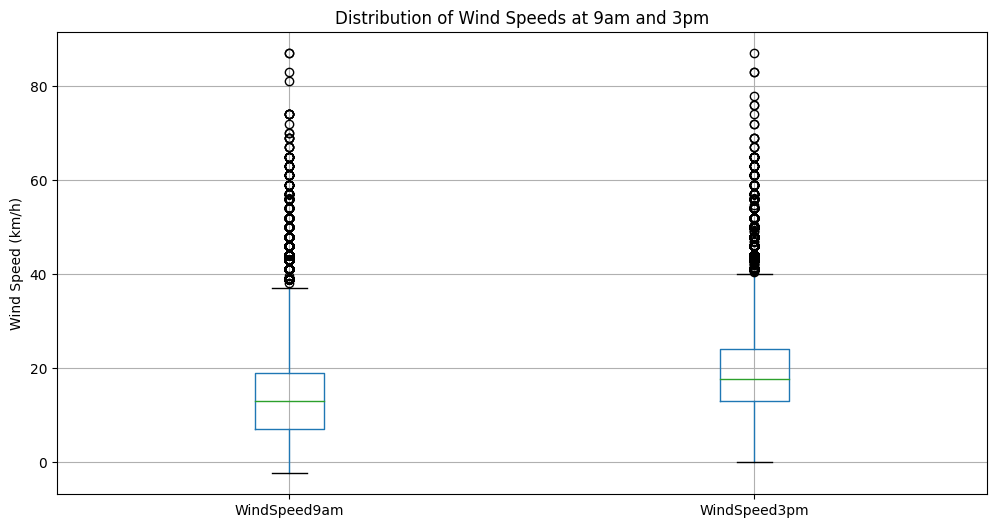

In [ ]:
# Plot box plots for Wind Speed at 9am and 3pm
plt.figure(figsize=(12, 6))
weather_df[['WindSpeed9am', 'WindSpeed3pm']].boxplot()
plt.title('Distribution of Wind Speeds at 9am and 3pm')
plt.ylabel('Wind Speed (km/h)')
plt.show()

**Insights**

Median Wind Speed: Around 14 km/h for both 9am and 3pm.

IQR: Similar variability with most wind speeds below 20 km/h.

Outliers: Several high wind speed outliers, peaking at 87 km/h.

More outliers: Higher frequency of outliers at 3pm compared to 9am.

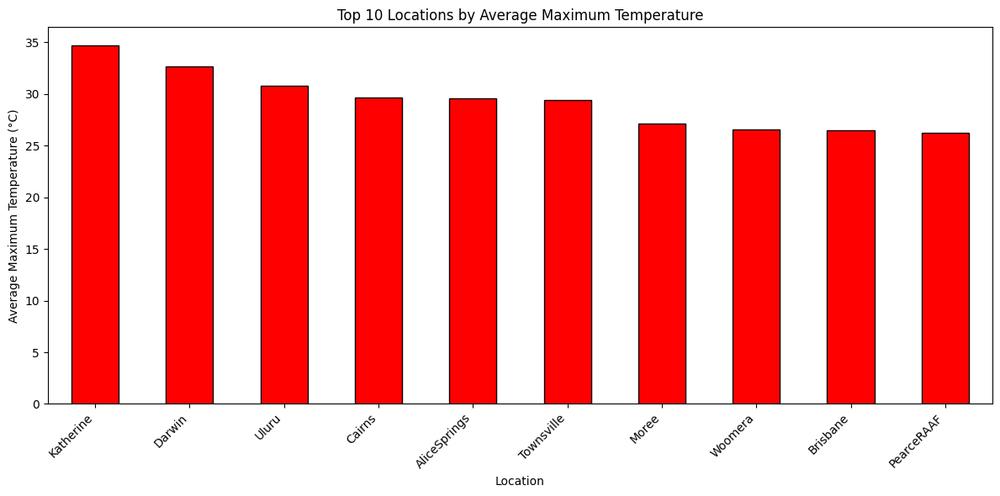

In [ ]:
# Calculate the mean maximum temperature for each location
top_max_temp_locations = weather_df.groupby('Location')['MaxTemp'].mean().sort_values(ascending=False).head(10)

# Create a bar chart for maximum temperature
plt.figure(figsize=(12, 6))
top_max_temp_locations.plot(kind='bar', color='red', edgecolor='black')
plt.title('Top 10 Locations by Average Maximum Temperature')
plt.xlabel('Location')
plt.ylabel('Average Maximum Temperature (°C)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

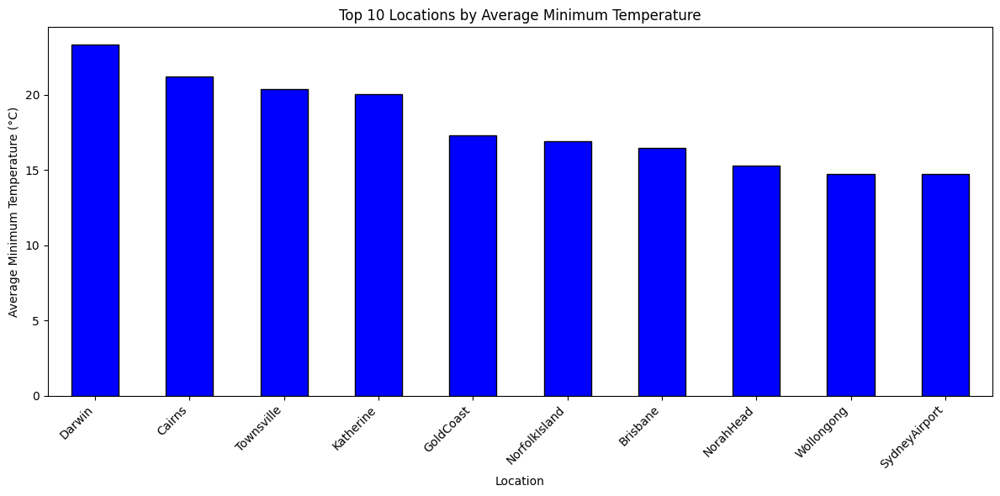

In [ ]:
# Calculate the mean minimum temperature for each location
top_min_temp_locations = weather_df.groupby('Location')['MinTemp'].mean().sort_values(ascending=False).head(10)

# Create a bar chart for minimum temperature
plt.figure(figsize=(12, 6))
top_min_temp_locations.plot(kind='bar', color='blue', edgecolor='black')
plt.title('Top 10 Locations by Average Minimum Temperature')
plt.xlabel('Location')
plt.ylabel('Average Minimum Temperature (°C)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

<ipython-input-42-9c33a28b5161>:2: MatplotlibDeprecationWarning:

The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.



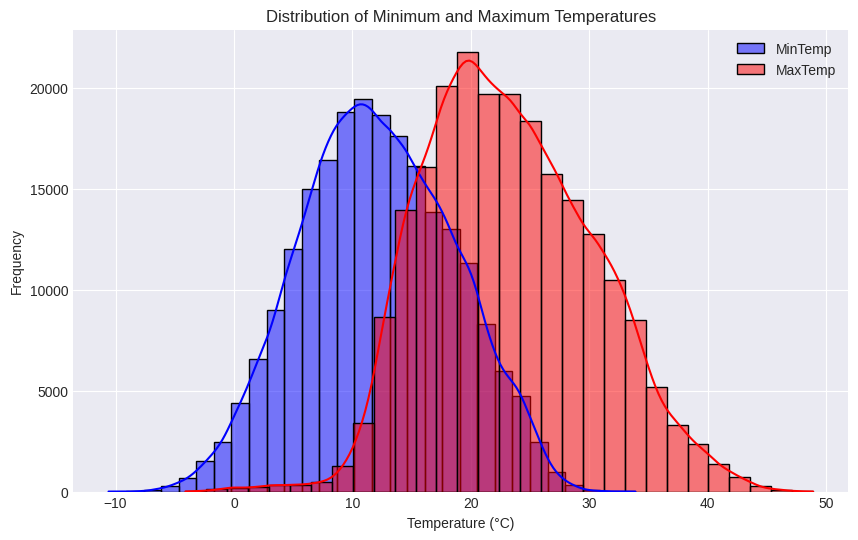

In [ ]:
# Set up the plotting environment
plt.style.use('seaborn-darkgrid')

# 1. Distribution of MinTemp and MaxTemp
plt.figure(figsize=(10, 6))
sns.histplot(weather_df['MinTemp'], kde=True, color='blue', label='MinTemp', bins=30)
sns.histplot(weather_df['MaxTemp'], kde=True, color='red', label='MaxTemp', bins=30)
plt.title('Distribution of Minimum and Maximum Temperatures')
plt.xlabel('Temperature (°C)')
plt.ylabel('Frequency')
plt.legend()
plt.show()

**Insights**:

1. **Temperature Distribution**: Minimum temperatures generally range from -10°C to 25°C, while maximum temperatures range from 0°C to 50°C.
2. **Overlap**: There is a significant overlap between 10°C and 25°C, indicating that both minimum and maximum temperatures are frequently observed within this range.
3. **Normal Distribution**: Both minimum and maximum temperatures show a roughly normal distribution, with minimum temperatures peaking around 10°C and maximum temperatures peaking around 20°C.

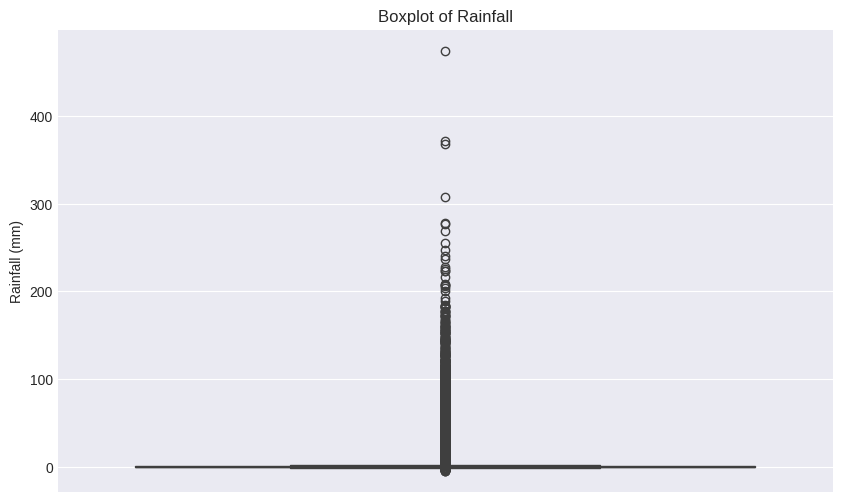

In [ ]:
# 2. Boxplot of Rainfall
plt.figure(figsize=(10, 6))
sns.boxplot(y='Rainfall', data=weather_df)
plt.title('Boxplot of Rainfall')
plt.ylabel('Rainfall (mm)')
plt.show()

**Insights**

Low Rainfall: Most rainfall values are close to zero, indicating that many days have little to no rainfall.

Outliers: There are several significant outliers with rainfall exceeding 100 mm, some reaching over 400 mm.

Concentration: The interquartile range is very narrow, showing that the majority of rainfall observations are minimal.

<Figure size 1500x800 with 0 Axes>

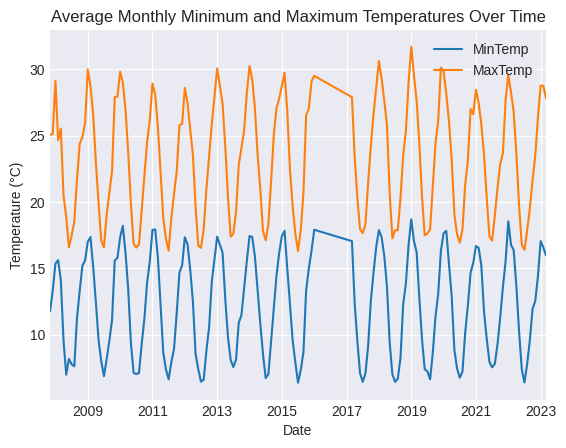

In [ ]:
# 3. Time Series plot for Temperature over the years
plt.figure(figsize=(15, 8))
weather_df.groupby(weather_df['Date'].dt.to_period('M'))[['MinTemp', 'MaxTemp']].mean().plot()
plt.title('Average Monthly Minimum and Maximum Temperatures Over Time')
plt.xlabel('Date')
plt.ylabel('Temperature (°C)')
plt.show()

**Insights**

Seasonal Variation: Both minimum and maximum temperatures show clear seasonal patterns, with peaks in summer and troughs in winter.

Consistent Trends: The general trend for minimum and maximum temperatures remains consistent over the years from 2008 to 2023.

Temperature Range: Maximum temperatures fluctuate between approximately 20°C and 30°C, while minimum temperatures fluctuate between approximately 5°C and 15°C.

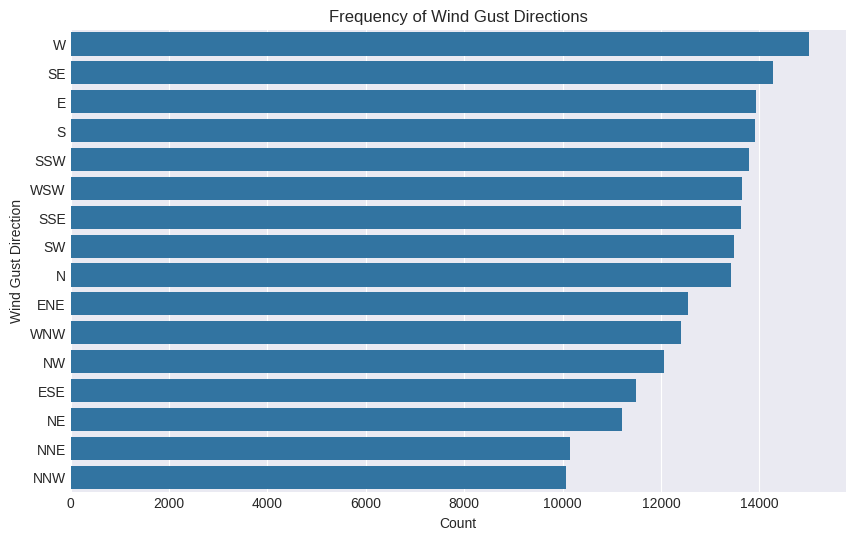

In [ ]:
# 4. WindGustDir Frequency
plt.figure(figsize=(10, 6))
sns.countplot(y='WindGustDir', data=weather_df, order=weather_df['WindGustDir'].value_counts().index)
plt.title('Frequency of Wind Gust Directions')
plt.xlabel('Count')
plt.ylabel('Wind Gust Direction')
plt.show()

### Bivariate Analysis

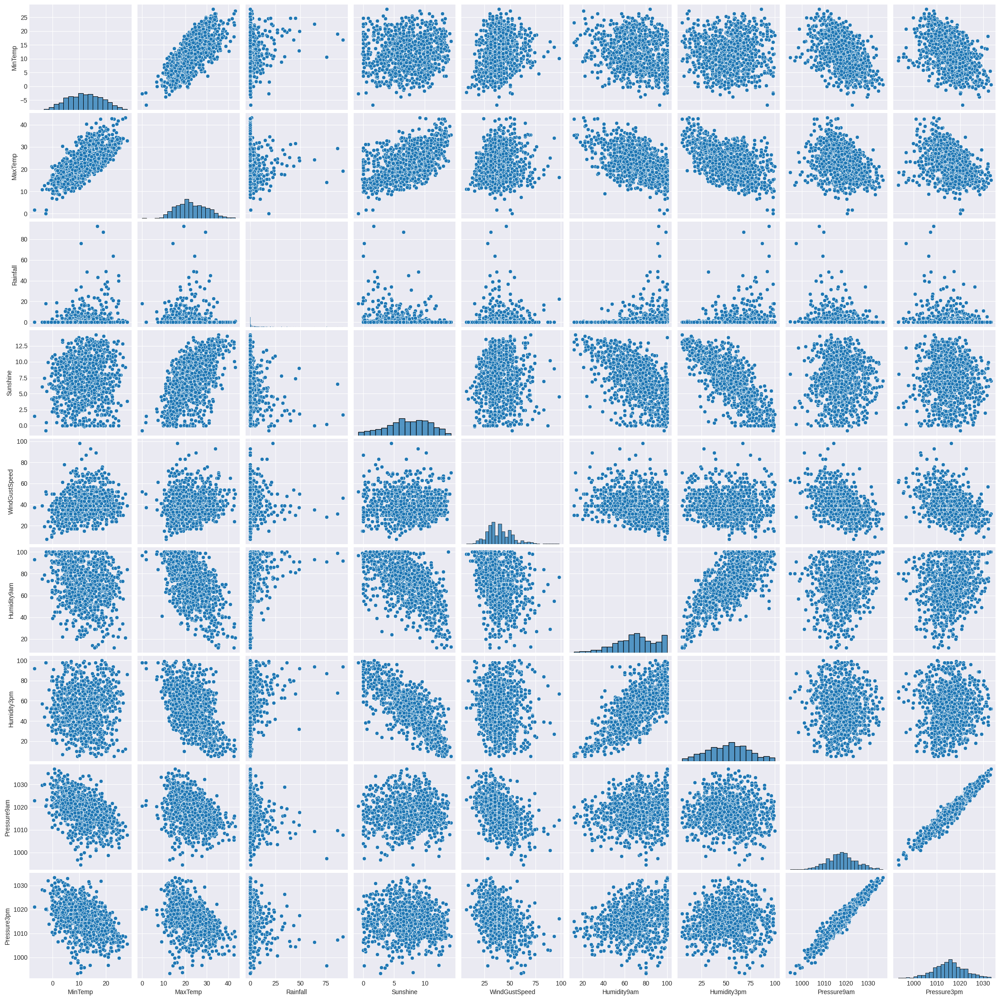

In [ ]:
# 5. Pairplot for selected numerical variables
selected_numerical_cols = ['MinTemp', 'MaxTemp', 'Rainfall', 'Sunshine', 'WindGustSpeed', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm']
sns.pairplot(weather_df[selected_numerical_cols].sample(1000))  # Sampling to reduce plot rendering time
plt.show()

**Highlights**

MinTemp vs MaxTemp: There is a strong positive correlation, indicating that days with higher minimum temperatures also tend to have higher maximum temperatures.

Temperature vs. Sunshine: Both MinTemp and MaxTemp show a positive correlation with Sunshine, suggesting that sunnier days tend to be warmer.

Humidity9am vs. Humidity3pm: There is a strong positive correlation, indicating that humidity levels in the morning are likely to remain high in the afternoon.

Pressure9am vs. Pressure3pm: There is a strong positive correlation, suggesting that atmospheric pressure remains relatively stable throughout the day.

Rainfall vs. RISK_MM: Rainfall and RISK_MM show a positive correlation, which is expected as RISK_MM represents the risk of rainfall

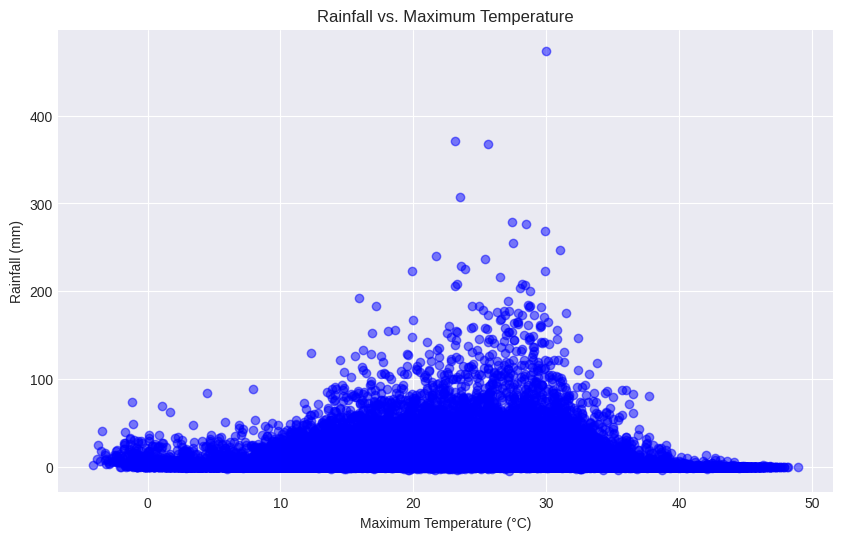

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(weather_df['MaxTemp'], weather_df['Rainfall'], alpha=0.5, color='blue')
plt.title('Rainfall vs. Maximum Temperature')
plt.xlabel('Maximum Temperature (°C)')
plt.ylabel('Rainfall (mm)')
plt.show()

**Insights**

The scatter plot shows that rainfall generally decreases as maximum temperature increases. Most significant rainfall events occur between 10°C and 30°C, while temperatures above 30°C are associated with low rainfall.

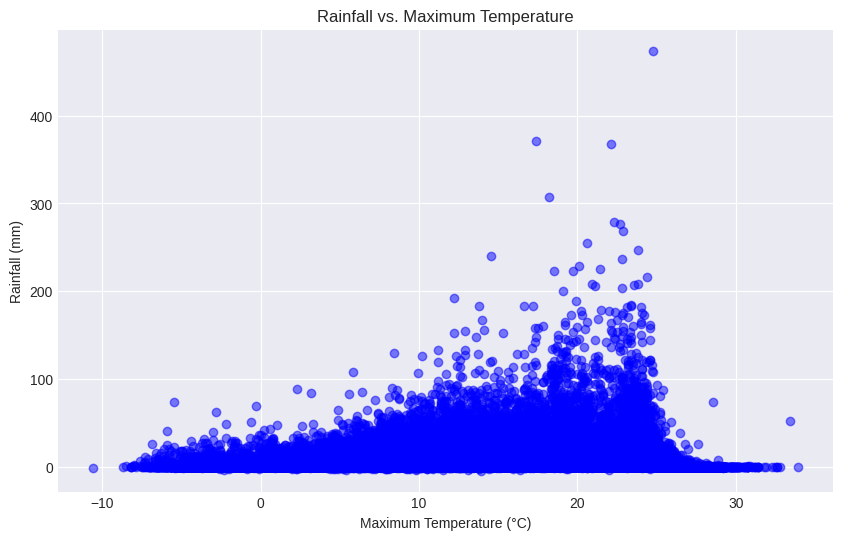

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(weather_df['MinTemp'], weather_df['Rainfall'], alpha=0.5, color='blue')
plt.title('Rainfall vs. Maximum Temperature')
plt.xlabel('Maximum Temperature (°C)')
plt.ylabel('Rainfall (mm)')
plt.show()


**Insights**

Rainfall is concentrated between 0°C and 20°C, with the highest rainfall around 10°C to 20°C. Rainfall decreases significantly above 25°C and below 0°C. Extreme temperatures (-10°C to 0°C and above 30°C) have minimal rainfall.

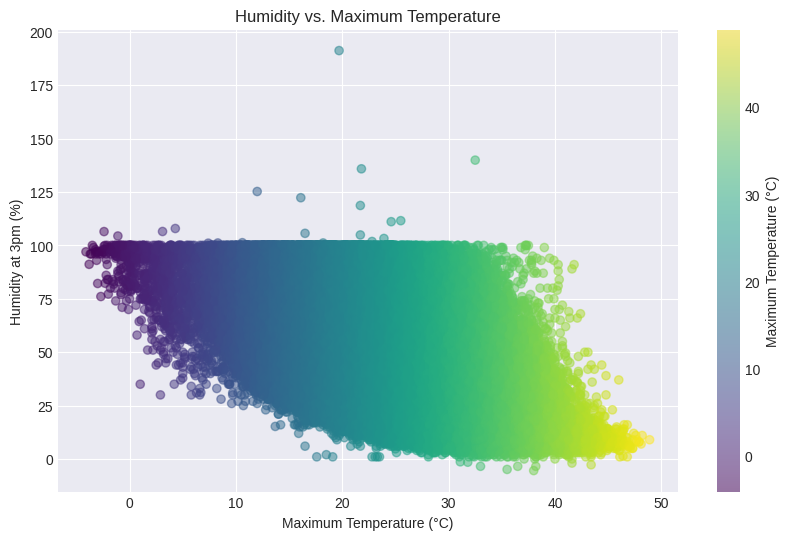

In [ ]:
# Plot with color representing maximum temperature
plt.figure(figsize=(10, 6))

# Use color mapping for better differentiation
plt.scatter(weather_df['MaxTemp'], weather_df['Humidity3pm'], alpha=0.5, c=weather_df['MaxTemp'], cmap='viridis')
plt.colorbar(label='Maximum Temperature (°C)')
plt.title('Humidity vs. Maximum Temperature')
plt.xlabel('Maximum Temperature (°C)')
plt.ylabel('Humidity at 3pm (%)')
plt.show()

**Insights**

Humidity generally decreases as maximum temperature increases. Humidity is highest (around 100) at lower temperatures (0°C to 20°C) and decreases significantly above 20°C, dropping to lower levels as temperature approaches 50°C.

<Figure size 1200x600 with 0 Axes>

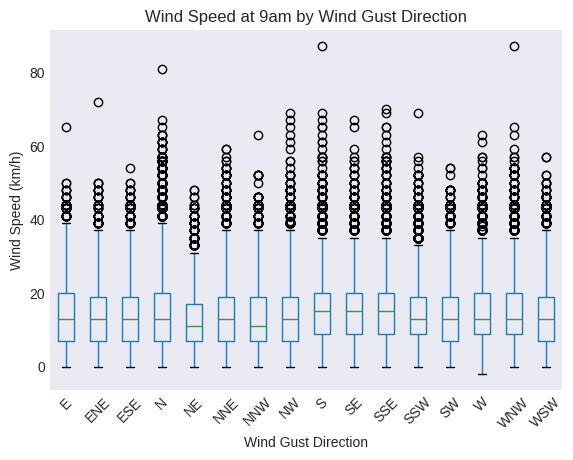

In [ ]:
plt.figure(figsize=(12, 6))
weather_df.boxplot(column='WindSpeed9am', by='WindGustDir', grid=False)
plt.title('Wind Speed at 9am by Wind Gust Direction')
plt.xlabel('Wind Gust Direction')
plt.ylabel('Wind Speed (km/h)')
plt.xticks(rotation=45)
plt.suptitle('')  # Suppress the automatic title to focus on the custom title
plt.show()

**Insights**

Wind speeds vary across different wind gust directions, with most median values around 15-25 km/h.

Each direction shows a similar range of wind speeds, with most data points concentrated below 40 km/h.

There are outliers reaching up to 80 km/h for several directions.

In [ ]:
# top locations by wind speed
# Group by Location and calculate the maximum wind gust speed for each location
top_wind_speed_locations = weather_df.groupby('Location')['WindGustSpeed'].max().sort_values(ascending=False).head(10)

# Convert the Series to a DataFrame for easier plotting
top_wind_speed_locations_df = top_wind_speed_locations.reset_index()

<ipython-input-52-20a9caab0ac1>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




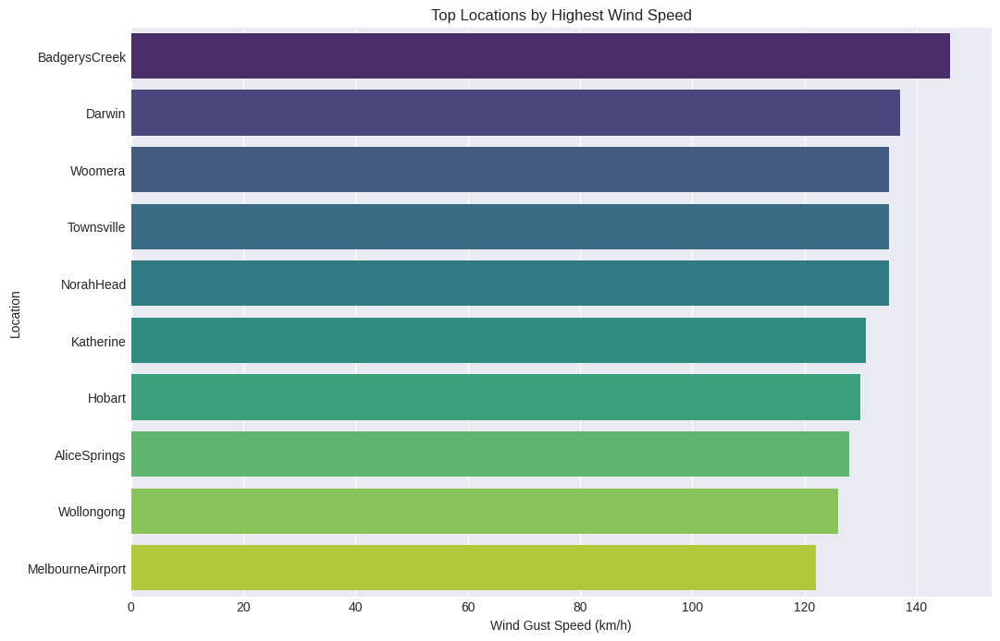

In [ ]:
# Plotting the top locations by highest wind speed
plt.figure(figsize=(12, 8))
sns.barplot(x='WindGustSpeed', y='Location', data=top_wind_speed_locations_df, palette='viridis')
plt.title('Top Locations by Highest Wind Speed')
plt.xlabel('Wind Gust Speed (km/h)')
plt.ylabel('Location')
plt.show()

<Figure size 1200x600 with 0 Axes>

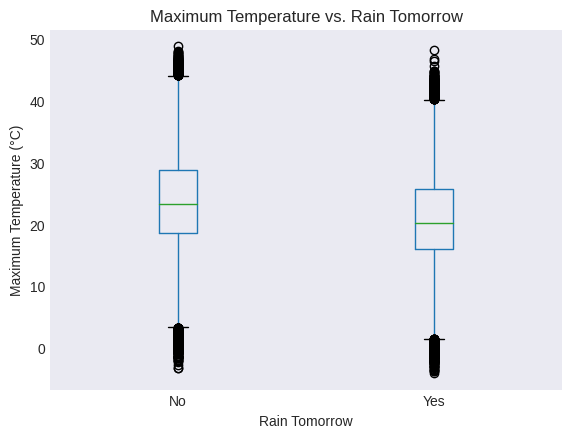

<Figure size 1200x600 with 0 Axes>

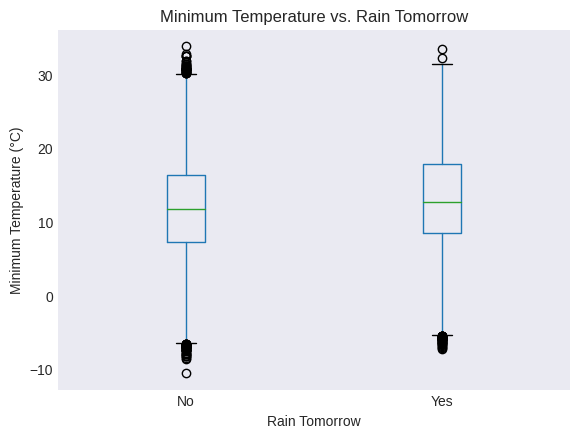

In [ ]:
plt.figure(figsize=(12, 6))
weather_df.boxplot(column='MaxTemp', by='RainTomorrow', grid=False)
plt.title('Maximum Temperature vs. Rain Tomorrow')
plt.xlabel('Rain Tomorrow')
plt.ylabel('Maximum Temperature (°C)')
plt.suptitle('')  # Suppress the automatic title to focus on the custom title
plt.show()

plt.figure(figsize=(12, 6))
weather_df.boxplot(column='MinTemp', by='RainTomorrow', grid=False)
plt.title('Minimum Temperature vs. Rain Tomorrow')
plt.xlabel('Rain Tomorrow')
plt.ylabel('Minimum Temperature (°C)')
plt.suptitle('')  # Suppress the automatic title to focus on the custom title
plt.show()

**Insights**

The median maximum temperature is slightly higher on days without rain (around 25°C) compared to days with rain (around 22°C).
The interquartile range (IQR) is similar for both categories, indicating similar temperature variability.
Both categories have similar ranges and outliers, with temperatures ranging from 0°C to nearly 50°C.

<Figure size 1200x600 with 0 Axes>

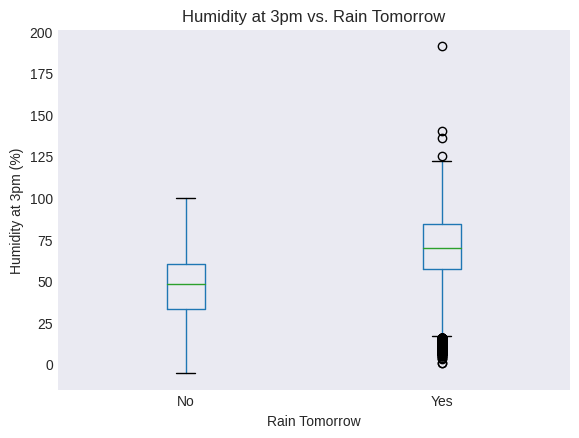

In [ ]:
plt.figure(figsize=(12, 6))
weather_df.boxplot(column='Humidity3pm', by='RainTomorrow', grid=False)
plt.title('Humidity at 3pm vs. Rain Tomorrow')
plt.xlabel('Rain Tomorrow')
plt.ylabel('Humidity at 3pm (%)')
plt.suptitle('')  # Suppress the automatic title to focus on the custom title
plt.show()

**Insights**

Humidity is higher on days when rain is forecasted for tomorrow, with a median around 65% compared to 50% on days without rain.

The interquartile range (IQR) is wider for days with rain, indicating more variability in humidity.

There are more outliers on days with rain, suggesting occasional very high humidity values (over 100).

The overall range of humidity is broader on days with rain, spanning from near 0 to over 175.

<Figure size 1200x600 with 0 Axes>

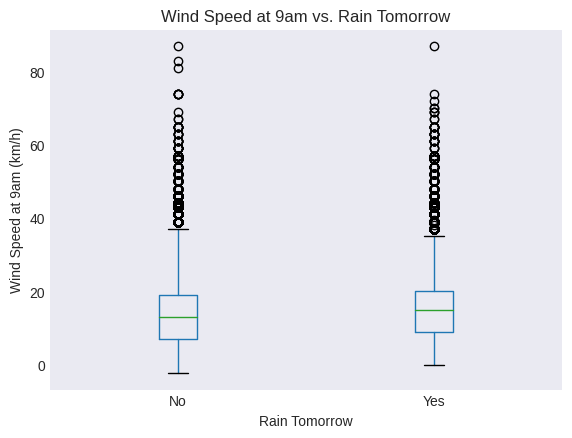

<Figure size 1200x600 with 0 Axes>

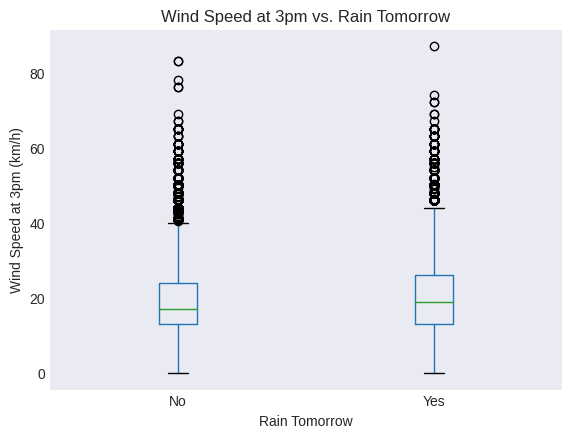

In [ ]:
plt.figure(figsize=(12, 6))
weather_df.boxplot(column='WindSpeed9am', by='RainTomorrow', grid=False)
plt.title('Wind Speed at 9am vs. Rain Tomorrow')
plt.xlabel('Rain Tomorrow')
plt.ylabel('Wind Speed at 9am (km/h)')
plt.suptitle('')  # Suppress the automatic title to focus on the custom title
plt.show()

plt.figure(figsize=(12, 6))
weather_df.boxplot(column='WindSpeed3pm', by='RainTomorrow', grid=False)
plt.title('Wind Speed at 3pm vs. Rain Tomorrow')
plt.xlabel('Rain Tomorrow')
plt.ylabel('Wind Speed at 3pm (km/h)')
plt.suptitle('')  # Suppress the automatic title to focus on the custom title
plt.show()

**Insights**

The median wind speed is similar for both categories, around 15-20 km/h.

The interquartile range (IQR) and overall distribution of wind speeds are nearly identical for both categories.

No significant difference in wind speed is observed between days with and without rain forecasted for tomorrow.



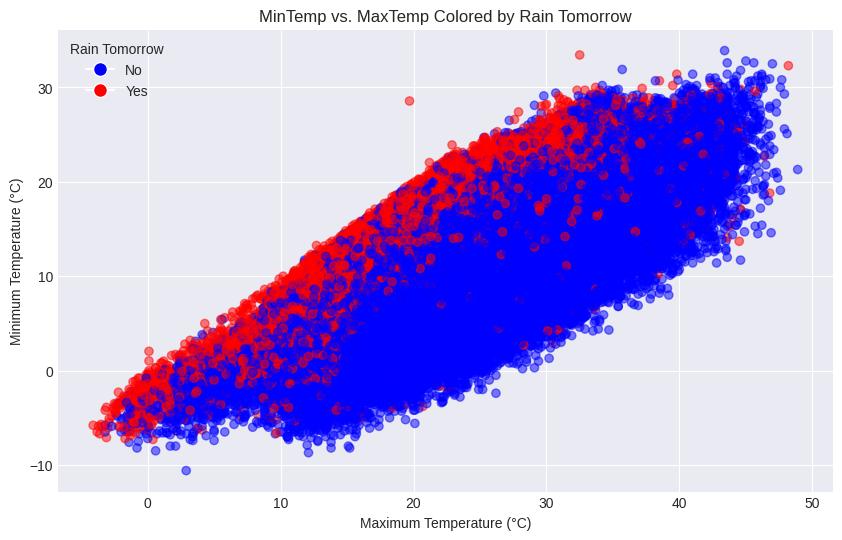

In [ ]:
plt.figure(figsize=(10, 6))
colors = {'No': 'blue', 'Yes': 'red'}
plt.scatter(weather_df['MaxTemp'], weather_df['MinTemp'], alpha=0.5, c=weather_df['RainTomorrow'].map(colors))
plt.title('MinTemp vs. MaxTemp Colored by Rain Tomorrow')
plt.xlabel('Maximum Temperature (°C)')
plt.ylabel('Minimum Temperature (°C)')
plt.legend(handles=[plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=10, label='No'),
                    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Yes')],
           title='Rain Tomorrow')
plt.show()

**Insights**

There seems to be a correlation between minimum and maximum temperatures.

Rain tomorrow (red points) is more frequent at lower temperature ranges, particularly where the maximum temperature is below 25°C.

As temperatures increase, the proportion of days with no rain tomorrow (blue points) becomes higher.

Therefore, there's a negative correlation between temperatures and the likelihood of rain tomorrow. Higher temperatures tend to be associated with a lower probability of rain the next day where as low tempature tends to lead to higher probablity of rain tomorrow.

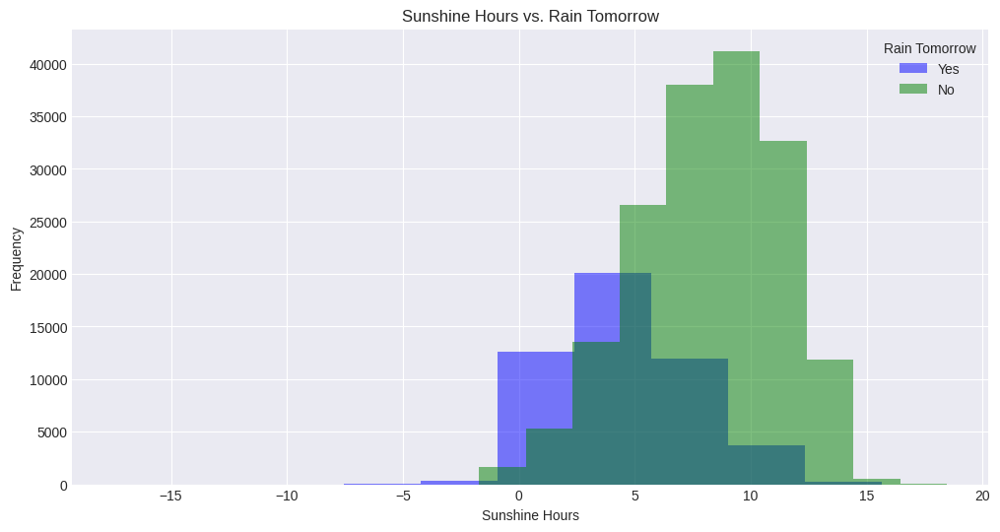

In [ ]:
plt.figure(figsize=(12, 6))
weather_df[weather_df['RainTomorrow'] == 'Yes']['Sunshine'].dropna().plot(kind='hist', alpha=0.5, color='blue', label='Yes')
weather_df[weather_df['RainTomorrow'] == 'No']['Sunshine'].dropna().plot(kind='hist', alpha=0.5, color='green', label='No')
plt.title('Sunshine Hours vs. Rain Tomorrow')
plt.xlabel('Sunshine Hours')
plt.ylabel('Frequency')
plt.legend(title='Rain Tomorrow')
plt.show()

**Insights**

Sunshine hours are generally higher on days with no rain forecasted for tomorrow, with a peak around 8-10 hours.

Days with rain forecasted for tomorrow tend to have fewer sunshine hours, mostly between 0 and 5 hours.

The overlap shows that days with less sunshine are more likely to have rain tomorrow, indicating a negative correlation between sunshine hours and the likelihood of rain the next day.

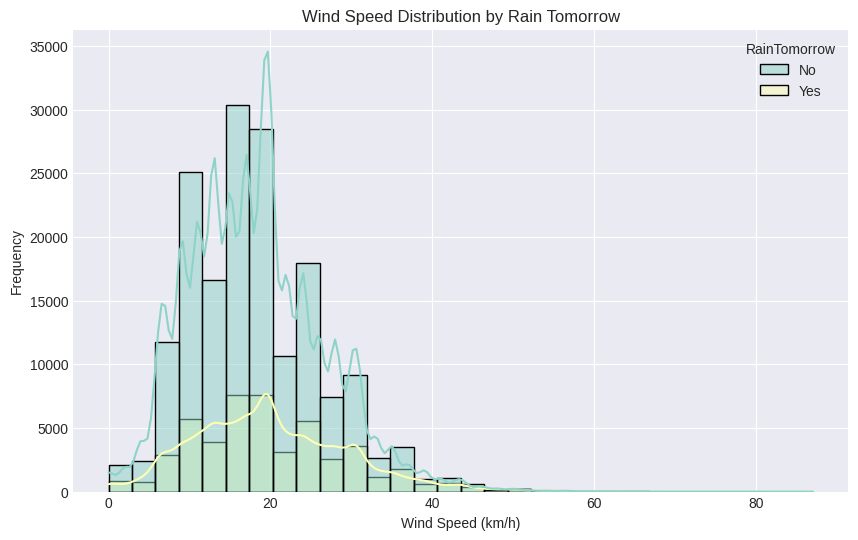

In [ ]:
# 3. Wind Speed Distribution by Rain Tomorrow
plt.figure(figsize=(10, 6))
sns.histplot(data=weather_df, x='WindSpeed3pm', hue='RainTomorrow', kde=True, palette='Set3', bins=30)
plt.title('Wind Speed Distribution by Rain Tomorrow')
plt.xlabel('Wind Speed (km/h)')
plt.ylabel('Frequency')
plt.show()

**Insights**

Higher Wind Speeds with No Rain: Higher wind speeds are more common on days when it is not expected to rain tomorrow.

Peak Around 20 km/h: Both distributions peak around 20 km/h, but the frequency is higher for non-rainy days.

Overlap: There is significant overlap between the two distributions, especially at lower wind speeds (0-20 km/h).

Less Variation with Rain: Wind speeds are less varied on days when rain is expected tomorrow, compared to non-rainy days.

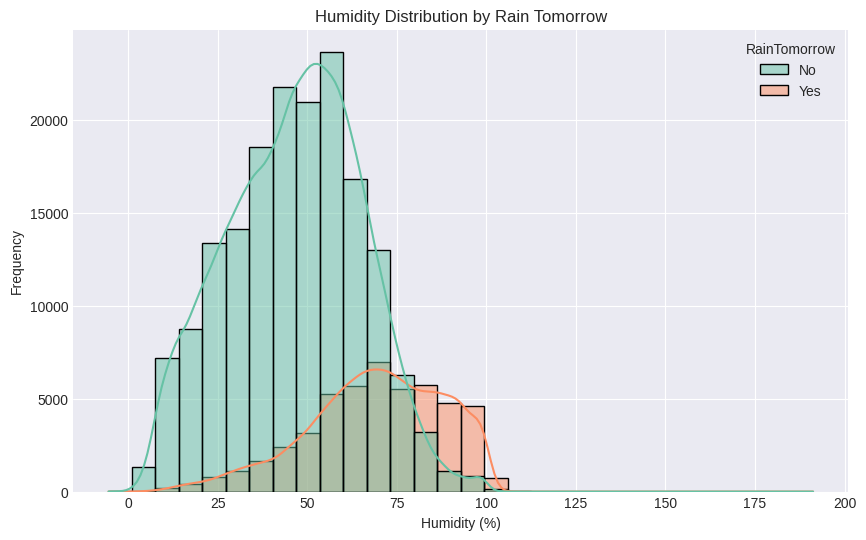

In [ ]:
# 4. Humidity Distribution by Rain Tomorrow
plt.figure(figsize=(10, 6))
sns.histplot(data=weather_df, x='Humidity3pm', hue='RainTomorrow', kde=True, palette='Set2', bins=30)
plt.title('Humidity Distribution by Rain Tomorrow')
plt.xlabel('Humidity (%)')
plt.ylabel('Frequency')
plt.show()

**Insightst**

Higher Humidity with Rain: Humidity levels are higher on days when rain is expected tomorrow.

Peak at 50% Humidity: Non-rainy days peak around 50% humidity, whereas rainy days peak closer to 80% humidity.

Distinct Distributions: The distribution for rainy days is more concentrated around higher humidity values compared to non-rainy days.

Overlap: There is some overlap between the distributions, but higher humidity levels are more frequently associated with rain expected tomorr

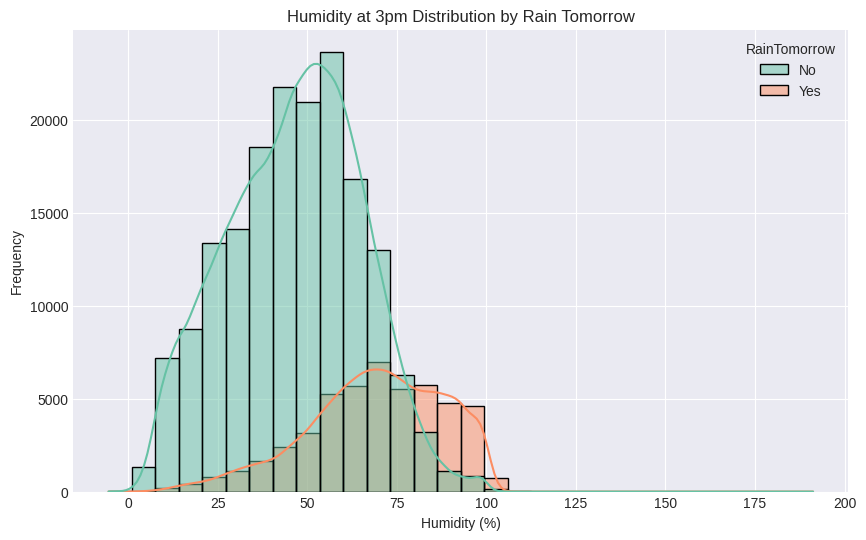

In [ ]:
# Histogram of Humidity at 3pm by Rain Tomorrow
plt.figure(figsize=(10, 6))
sns.histplot(data=weather_df, x='Humidity3pm', hue='RainTomorrow', kde=True, palette='Set2', bins=30)
plt.title('Humidity at 3pm Distribution by Rain Tomorrow')
plt.xlabel('Humidity (%)')
plt.ylabel('Frequency')
plt.show()

**Highlights**

Higher Humidity with Rain: Days when it will rain tomorrow generally have higher humidity levels at 3 pm.

Distinct Peaks: Non-rainy days peak around 50% humidity, while rainy days peak closer to 80% humidity.

Overlap: There is some overlap between the distributions, but  higher humidity levels seem to be more frequently associated with rain expected tomorrow.

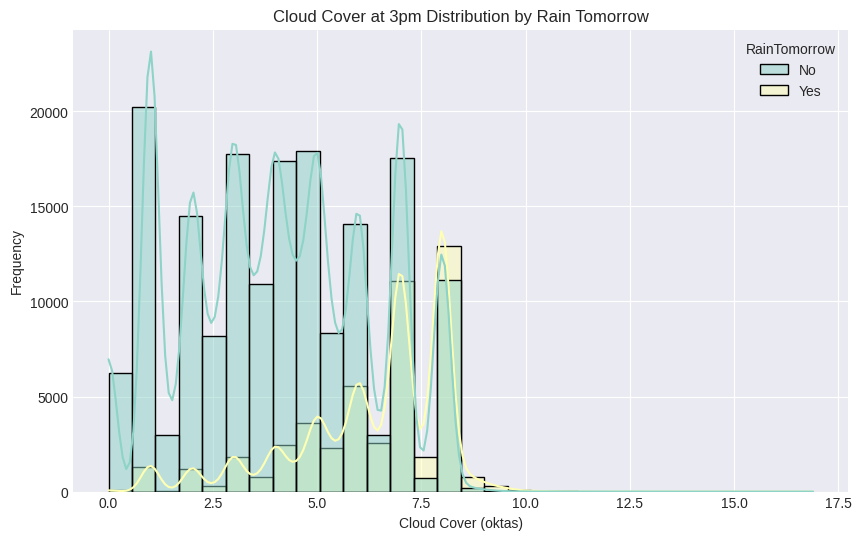

In [ ]:
# Histogram of Cloud3pm by Rain Tomorrow
plt.figure(figsize=(10, 6))
sns.histplot(data=weather_df, x='Cloud3pm', hue='RainTomorrow', kde=True, palette='Set3', bins=30)
plt.title('Cloud Cover at 3pm Distribution by Rain Tomorrow')
plt.xlabel('Cloud Cover (oktas)')
plt.ylabel('Frequency')
plt.show()

**Insights**

Days with no rain forecasted for tomorrow (green bars) have a wider range of cloud cover values, but tend to peak at lower cloud cover (0 to 5 oktas).

Days with rain forecasted for tomorrow (yellow bars) show a higher frequency of higher cloud cover values (5 to 8 oktas).

The overall distribution suggests that higher cloud cover at 3pm is more associated with the likelihood of rain tomorrow

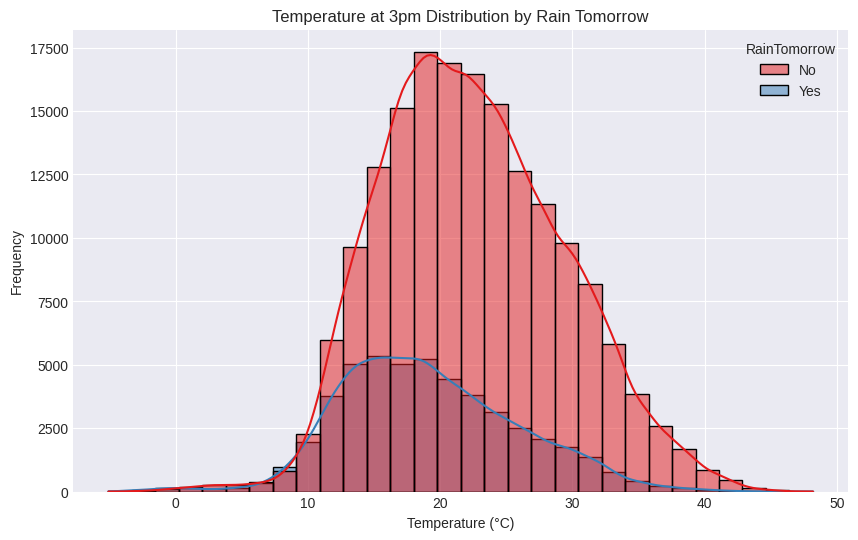

In [ ]:
# Histogram of Temp3pm by Rain Tomorrow
plt.figure(figsize=(10, 6))
sns.histplot(data=weather_df, x='Temp3pm', hue='RainTomorrow', kde=True, palette='Set1', bins=30)
plt.title('Temperature at 3pm Distribution by Rain Tomorrow')
plt.xlabel('Temperature (°C)')
plt.ylabel('Frequency')
plt.show()

**Insights**

Days with no rain forecasted for tomorrow (red bars) tend to have higher temperatures, peaking around 20-25°C.

Days with rain forecasted for tomorrow (blue bars) are more frequent at lower temperatures, peaking around 15-20°C.

There seems to be a shift where higher temperatures are more associated with no rain, while lower temperatures are more associated with rain forecasted for tomorrow.

The overall distribution suggests that cooler temperatures at 3pm are more likely to be followed by rain the next day.

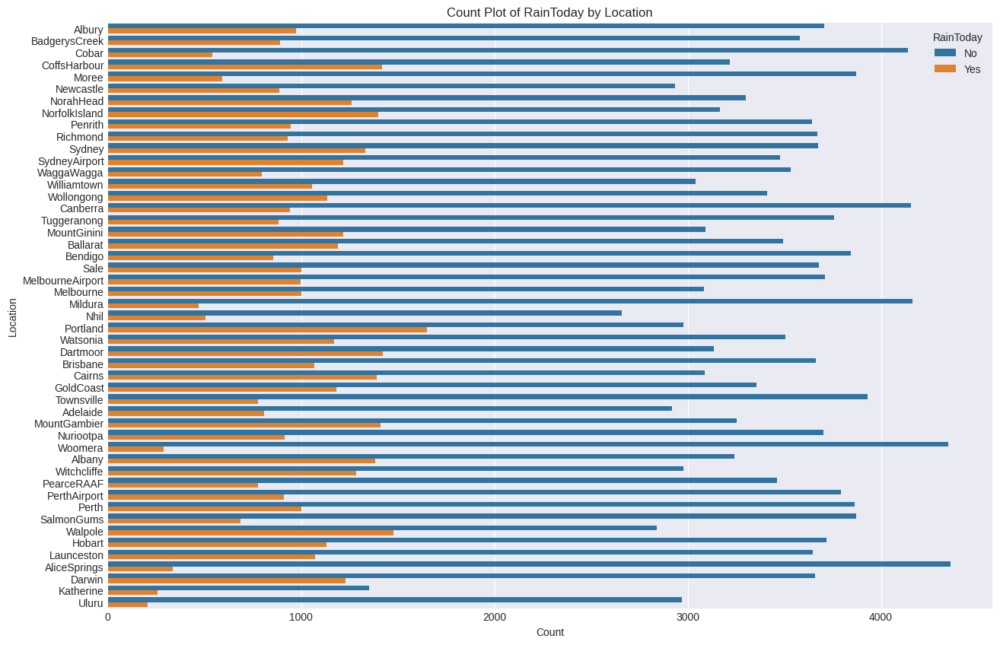

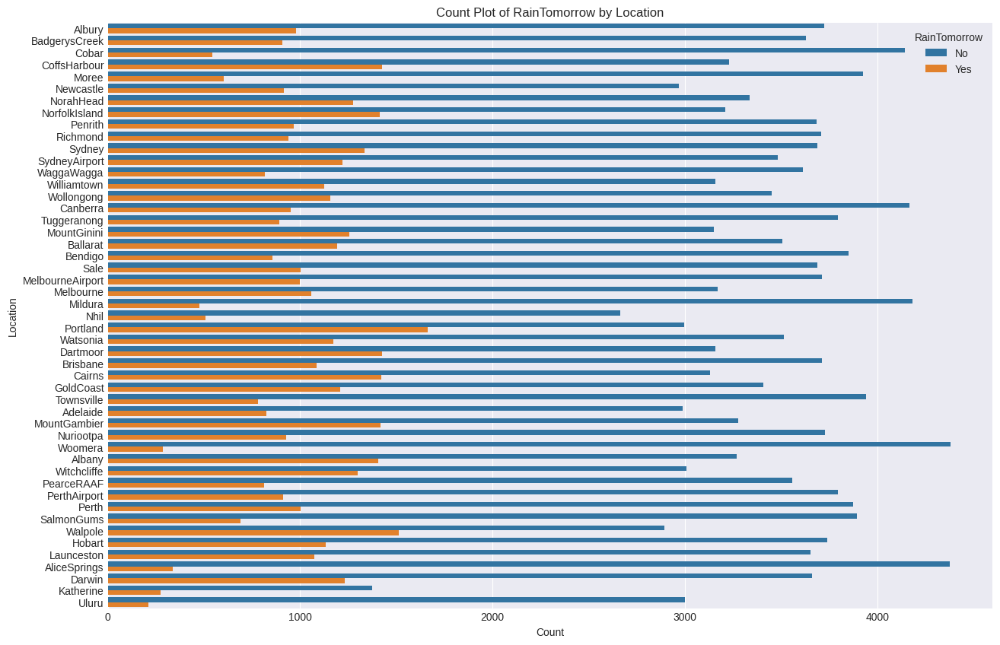

In [ ]:
# Count Plot of RainToday and RainTomorrow by Location
plt.figure(figsize=(15, 10))
sns.countplot(y='Location', hue='RainToday', data=weather_df)
plt.title('Count Plot of RainToday by Location')
plt.xlabel('Count')
plt.ylabel('Location')
plt.legend(title='RainToday')
plt.show()

plt.figure(figsize=(15, 10))
sns.countplot(y='Location', hue='RainTomorrow', data=weather_df)
plt.title('Count Plot of RainTomorrow by Location')
plt.xlabel('Count')
plt.ylabel('Location')

plt.legend(title='RainTomorrow')
plt.show()

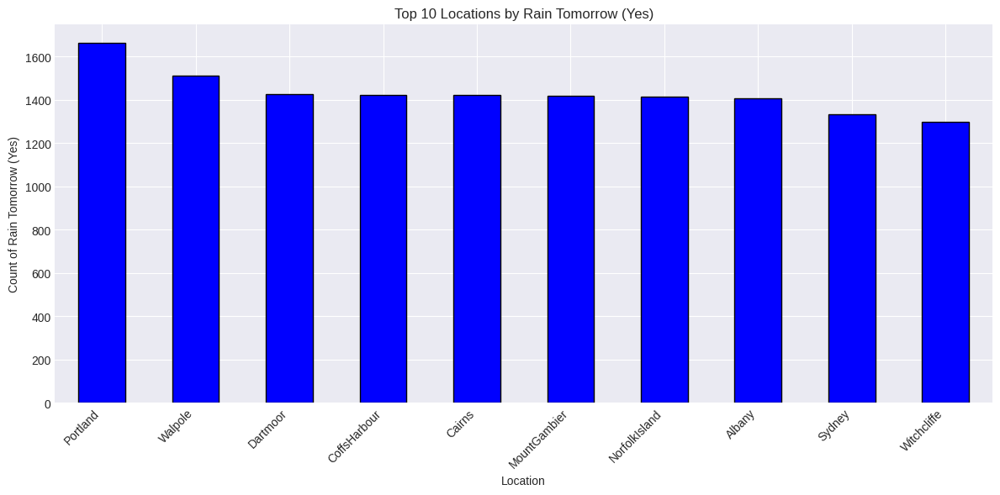

In [ ]:
# Calculate the count of 'Yes' for RainTomorrow for each location
top_rain_tomorrow_locations = weather_df[weather_df['RainTomorrow'] == 'Yes'].groupby('Location').size().sort_values(ascending=False).head(10)

# Create a bar chart for top 10 locations by RainTomorrow
plt.figure(figsize=(12, 6))
top_rain_tomorrow_locations.plot(kind='bar', color='blue', edgecolor='black')
plt.title('Top 10 Locations by Rain Tomorrow (Yes)')
plt.xlabel('Location')
plt.ylabel('Count of Rain Tomorrow (Yes)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


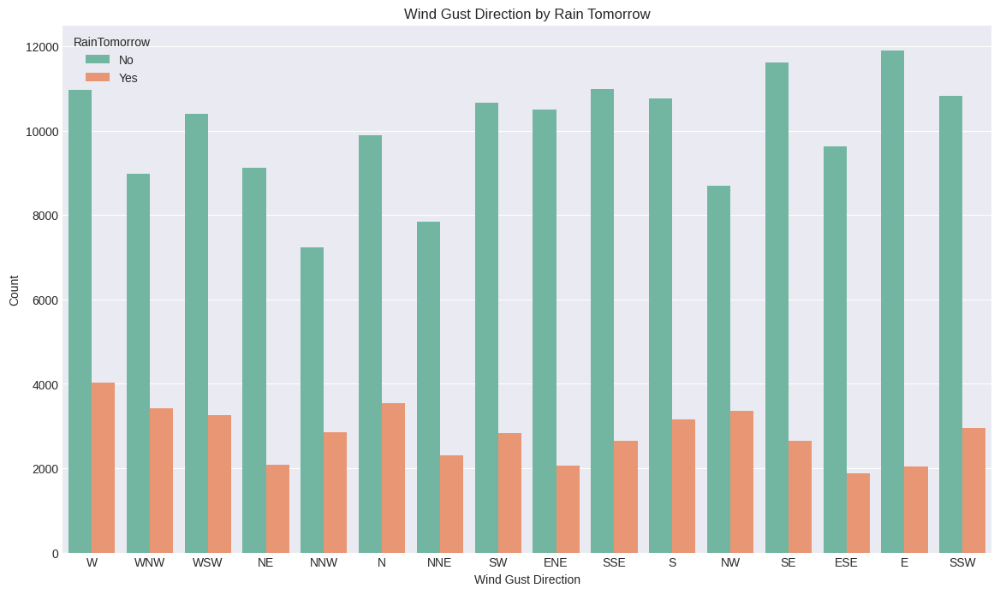

In [ ]:
# Bar Plot of WindGustDir by Rain Tomorrow
plt.figure(figsize=(14, 8))
sns.countplot(data=weather_df, x='WindGustDir', hue='RainTomorrow', palette='Set2')
plt.title('Wind Gust Direction by Rain Tomorrow')
plt.xlabel('Wind Gust Direction')
plt.ylabel('Count')
plt.show()

**Insights**

W direction is the highest for both rain and non rain.

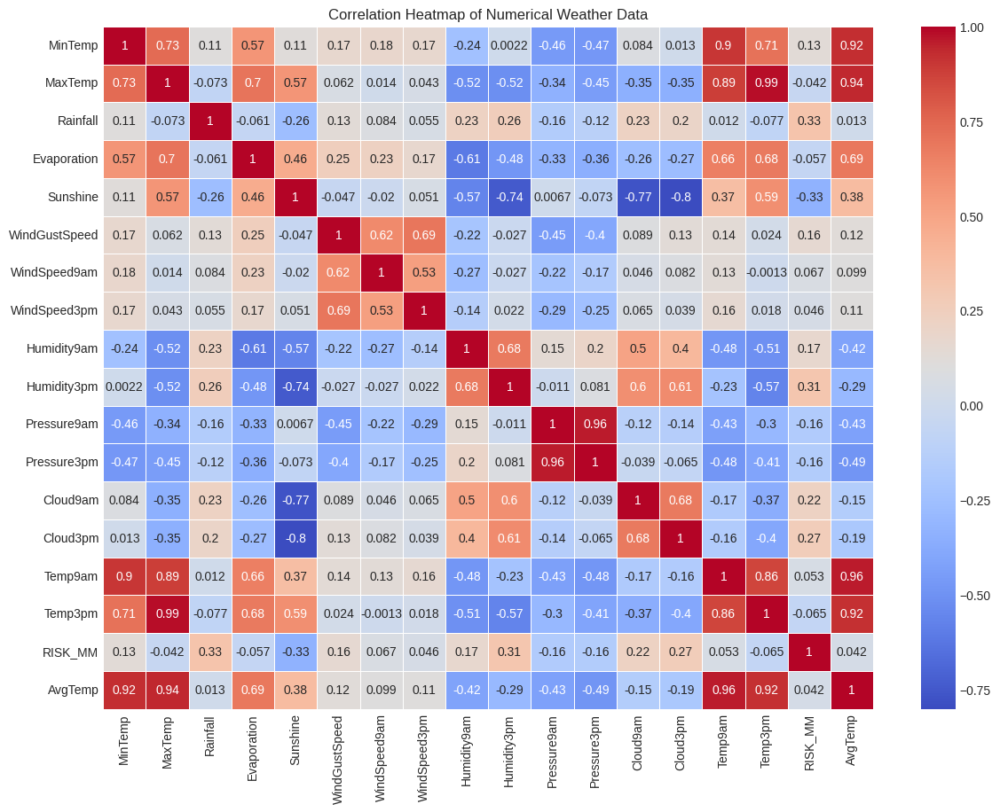

In [ ]:
# Select only the numerical features
numerical_features = weather_df.select_dtypes(include=['float64', 'int64'])

# Calculate the correlation matrix
corr_matrix = numerical_features.corr()

# Plotting the heatmap for numerical features only
plt.figure(figsize=(14, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap of Numerical Weather Data')
plt.show()

**Insights**

**High Positive Correlations:**

Evaporation and MaxTemp: 0.70

Evaporation and Temp3pm: 0.68

Pressure9am and Pressure3pm: 0.96

Cloud3pm and Cloud9am: 0.68

Humidity9am and Humidity3pm: 0.68

WindGustSpeed and WindSpeed3pm: 0.69

**High Negative Correlations:**

Sunshine and Cloud3pm: -0.80

Sunshine and Cloud9am: -0.77

Humidity3pm and Sunshine: -0.74

Humidity9am and Sunshine: -0.57

Pressure9am and MinTemp: -0.46

Pressure9am and Humidity9am: -0.45

Pressure3pm and Humidity9am: -0.45

Pressure9am and Cloud9am: -0.43

Pressure3pm and Cloud9am: -0.41

Pressure3pm and Cloud3pm: -0.43

**Other Interesting Correlations:**

Evaporation and Sunshine: 0.46

Sunshine and MaxTemp: 0.57

Sunshine and Temp3pm: 0.59

WindGustSpeed and WindSpeed9am: 0.53

Cloud3pm and Rainfall: 0.23

Cloud9am and Rainfall: 0.23

Humidity3pm and Rainfall: 0.23

Humidity9am and Rainfall: 0.23

RISK_MM and Rainfall: 0.31

In [ ]:
weather_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 220094 entries, 0 to 226867
Data columns (total 27 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Date           220094 non-null  datetime64[ns]
 1   Location       220094 non-null  object        
 2   MinTemp        220094 non-null  float64       
 3   MaxTemp        220094 non-null  float64       
 4   Rainfall       220094 non-null  float64       
 5   Evaporation    220094 non-null  float64       
 6   Sunshine       220094 non-null  float64       
 7   WindGustDir    205050 non-null  object        
 8   WindGustSpeed  220094 non-null  float64       
 9   WindDir9am     203539 non-null  object        
 10  WindDir3pm     211194 non-null  object        
 11  WindSpeed9am   220094 non-null  float64       
 12  WindSpeed3pm   220094 non-null  float64       
 13  Humidity9am    220094 non-null  float64       
 14  Humidity3pm    220094 non-null  float64       
 15  Press

In [ ]:
import pandas as pd
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
from sklearn.feature_selection import RFE
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
# drop date column
weather_df.drop('Date', axis=1, inplace=True)

In [ ]:
# drop year
weather_df.drop('Year', axis=1, inplace=True)

In [ ]:
# Calculate daily average temperature
weather_df['AvgTemp'] = (weather_df['MinTemp'] + weather_df['MaxTemp']) / 2

In [ ]:
# One-Hot Encode Categorical Variables, including RainTomorrow
categorical_cols = weather_df.select_dtypes(include=['object']).columns
weather_df_encoded = pd.get_dummies(weather_df, columns=categorical_cols, drop_first=True)


In [ ]:
# Separate the target variable 'RainTomorrow_Yes' and features
X = weather_df_encoded.drop(columns=['RainTomorrow_Yes'])
y = weather_df_encoded['RainTomorrow_Yes']


In [ ]:
# Step 2: Min-Max Scaling
scaler = MinMaxScaler()
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns
X[numerical_cols] = scaler.fit_transform(X[numerical_cols])

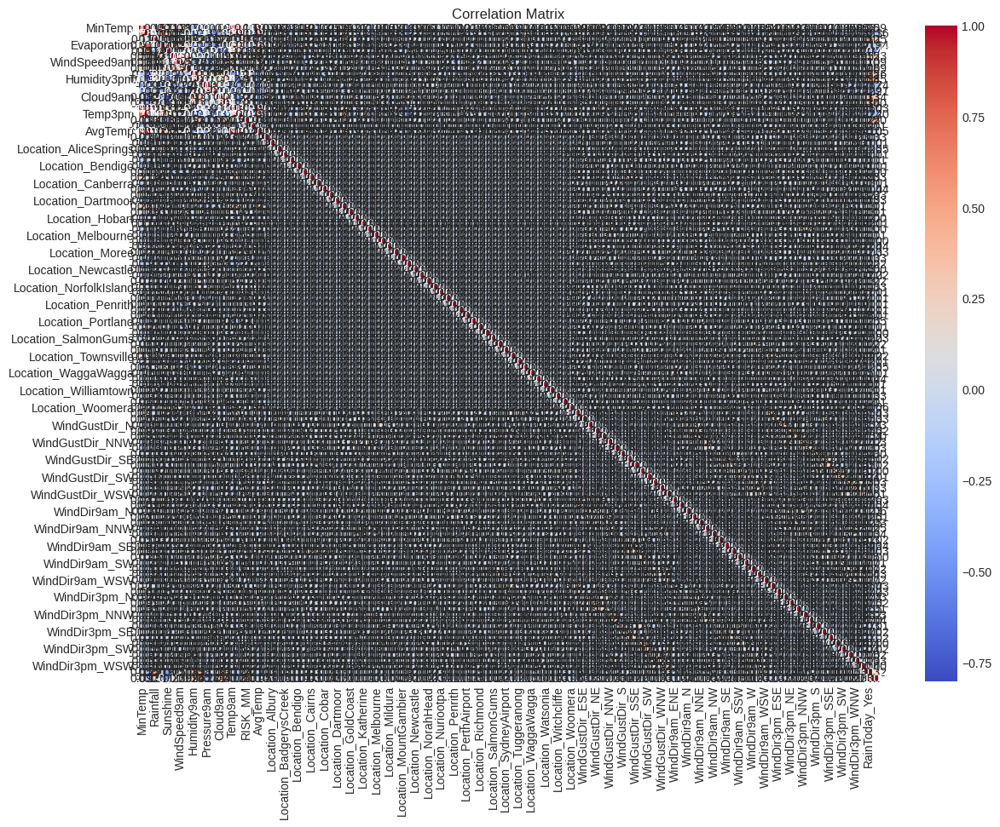

In [ ]:
# Step 3: Correlation Analysis
correlation_matrix = weather_df_encoded.corr()
plt.figure(figsize=(14, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

In [ ]:
# Step 4: Feature Importance Using Logistic Regression on a Sample
# Take a sample to fit the logistic regression model quickly
X_sample, _, y_sample, _ = train_test_split(X, y, test_size=0.9, random_state=42)

In [ ]:
# Initialize and fit Logistic Regression model on the sample
model = LogisticRegression(max_iter=1000)
model.fit(X_sample, y_sample)

LogisticRegression(max_iter=1000)

In [ ]:
# Get the coefficients of the logistic regression model
coefficients = pd.DataFrame(model.coef_[0], X_sample.columns, columns=['Coefficient'])

# Sort coefficients by their absolute values in descending order
coefficients = coefficients.reindex(coefficients.Coefficient.abs().sort_values(ascending=False).index)

# Display the top 10 relevant features
print(coefficients.head(10))

                      Coefficient
RISK_MM                 25.961086
Humidity3pm              8.522127
WindGustSpeed            6.472121
Sunshine                -6.187657
Pressure3pm             -5.203720
Pressure9am              1.963852
Rainfall                 1.889929
Cloud3pm                 1.328668
Evaporation             -1.291791
Location_MountGinini    -1.245833


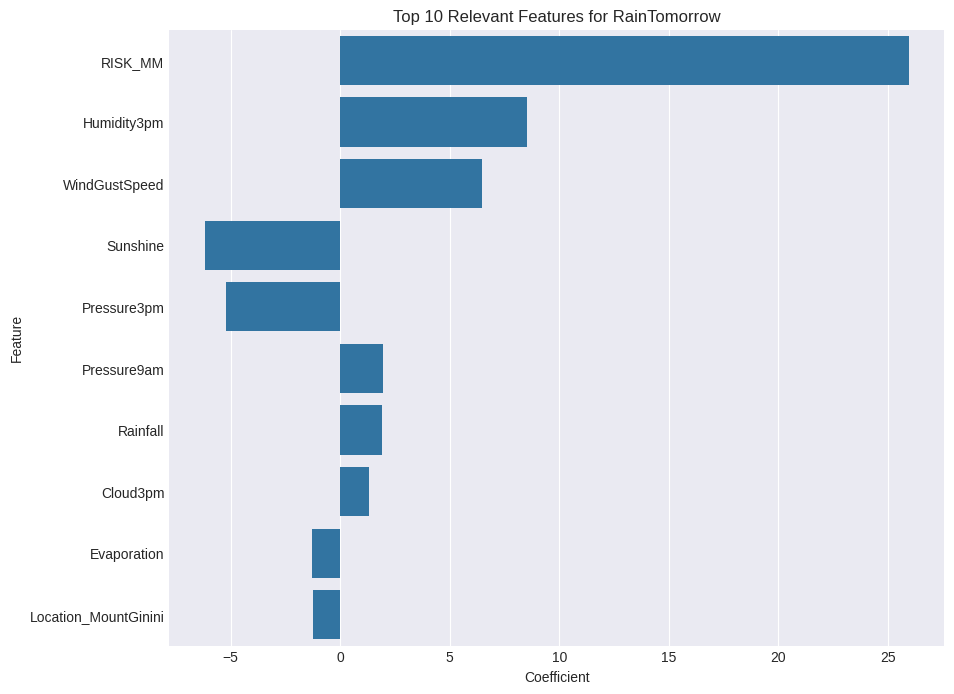

In [ ]:
# Plot the coefficients
plt.figure(figsize=(10, 8))
sns.barplot(x=coefficients.head(10).Coefficient, y=coefficients.head(10).index)
plt.title('Top 10 Relevant Features for RainTomorrow')
plt.xlabel('Coefficient')
plt.ylabel('Feature')
plt.show()

In [ ]:
# Step 5: PCA and Create a New Table with 2 Components and Target
pca = PCA(n_components=2)
principal_components = pca.fit_transform(X)
pca_df = pd.DataFrame(data=principal_components, columns=['Principal Component 1', 'Principal Component 2'])
pca_df['RainTomorrow'] = y.values
print(pca_df.head())

In [ ]:
# Plot the PCA components
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Principal Component 1', y='Principal Component 2', hue='RainTomorrow', data=pca_df, palette='coolwarm')
plt.title('PCA of Weather Data')
plt.show()

**Insights**

There is a pattern of vertical alignment of points, suggesting some regularity or periodicity in the data.

There is an overlap between the two classes (rain tomorrow: True and False), indicating that PCA does not completely separate these classes.

The distribution of both classes appears similar along the principal

components, suggesting that additional features or a different method might be needed to better distinguish between the two classes.